### RNAPuzzle test

In [12]:
import os

os.chdir("/home/adamczykb/rnaquanet/src")
from rnaquanet.dataset.RNAQuANetDataset import RNAQuANetDataset
import torch
import torch.nn as nn
from torch_geometric import nn as gnn
import lightning as L
from pdbfixer import PDBFixer
from openmm.app import PDBFile
from Bio import PDB
import numpy as np
import pandas as pd
import scipy.stats as stats
from matplotlib import pyplot as plt

### Model

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F


def spearman(predictions, targets):


    n = len(predictions.view(-1))

    # Calculate the differences between rankings
    d = torch.argsort(targets.view(-1), dim=-1)-torch.argsort(predictions.view(-1), dim=-1)

    # Square the differences
    d_squared = d ** 2

    # Sum the squared differences
    d_squared_sum = torch.sum(d_squared)

    # Calculate Spearman correlation coefficient
    # Formula: ρ = 1 - (6 * Σd² / (n * (n² - 1)))
    
    return 1 - (6 * d_squared_sum) / (n * (n**2 - 1))



class SpearmanLoss(nn.Module):
    def __init__(self, regularization_weight=0.1):
        super(SpearmanLoss, self).__init__()
        self.regularization_weight = regularization_weight

    def forward(self, predictions, targets):
        # Standard loss component (e.g., MAE)
        mae_loss =  (torch.abs(predictions - targets)).mean()
        
        # Soft rank correlation component

        # Overall loss: combine MSE and negative correlation 
        # (we negate correlation because we want to maximize it)
        loss = (
            1 - self.regularization_weight
        ) * mae_loss - self.regularization_weight * spearman(predictions, targets)

        return loss
    
    def _soft_rank(self, x):
        """Soft rank function using pairwise comparisons"""
        n = x.size(0)
        # Create a matrix where each entry (i,j) compares x[i] > x[j]
        diff = x.unsqueeze(0) - x.unsqueeze(1)
        # Convert differences to probabilities with sigmoid
        prob_greater = torch.sigmoid(diff * 10)  # Temperature scaling for sharper transitions
        # Sum across rows to get soft ranks
        soft_ranks = prob_greater.sum(dim=1)
        return soft_ranks



class RNAQuANet(L.LightningModule):
    def __init__(self, number_of_node_features: int):
        super().__init__()
        self.save_hyperparameters()
        self.norm1 = gnn.BatchNorm(number_of_node_features)

        self.GATconv1 = gnn.GATv2Conv(
            number_of_node_features, number_of_node_features, heads=4, edge_dim=36
        )

        self.GATconv2 = gnn.GATv2Conv(
            number_of_node_features * 4, number_of_node_features, heads=4, edge_dim=36
        )
        self.GATconv3 = gnn.GATv2Conv(
            number_of_node_features * 4, number_of_node_features, heads=4, edge_dim=36
        )

        self.GCN2Conv1 = gnn.GeneralConv(
            number_of_node_features * 4, number_of_node_features, in_edge_channels=36
        )

        self.fc1 = nn.Linear(number_of_node_features, number_of_node_features)
        self.fc3 = nn.Linear(number_of_node_features, 1)
        self.dropout = nn.Dropout(0.3)
        self.activation = nn.LeakyReLU()
        self.activationlast = nn.ReLU()
        self.aggregation = gnn.aggr.SetTransformerAggregation(
            number_of_node_features, dropout=0.3, layer_norm=True
        )
        self.criterion = SpearmanLoss(regularization_weight=0.5)

    def forward(self, x, edge_index, edge_attr, batch):

        y = self.norm1(x)
        y = self.GATconv1(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GATconv2(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GATconv3(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GCN2Conv1(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)

        y = self.aggregation(y, batch)

        y = self.fc1(y)
        y = self.activation(y)
        y = self.dropout(y)

        y = self.fc3(y)

        return self.activationlast(y)

    def training_step(self, data, batch_idx):
        result = self.forward(data.x, data.edge_index, data.edge_attr, data.batch)

        loss_corr = self.criterion(result, data.y.unsqueeze(-1))
        loss_mae = (torch.abs(result - data.y.unsqueeze(-1))).mean()
        loss_mse = (torch.square(torch.abs(result - data.y.unsqueeze(-1)))).mean()

        self.log("train_spearman_loss", loss_corr, batch_size=125)
        self.log(
            "train_spearman", spearman(result, data.y.unsqueeze(-1)), batch_size=125
        )
        self.log("train_loss_mae", loss_mae, batch_size=125)
        self.log("train_loss_mse", loss_mse, batch_size=125)
        return loss_mae

    def validation_step(self, data, batch_idx):
        result = self.forward(data.x, data.edge_index, data.edge_attr, data.batch)
        loss_corr = self.criterion(result, data.y.unsqueeze(-1))
        loss_mae = (torch.abs(result - data.y.unsqueeze(-1))).mean()
        loss_mse = (torch.square(torch.abs(result - data.y.unsqueeze(-1)))).mean()

        self.log("val_spearman_loss", loss_corr, batch_size=125)
        self.log("val_spearman", spearman(result, data.y.unsqueeze(-1)), batch_size=125)
        self.log("val_loss_mae", loss_mae, batch_size=125)
        self.log("val_loss_mse", loss_mse, batch_size=125)
        return loss_mae

    def backward(self, loss):
        loss.backward()

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

In [14]:
dataset_test = RNAQuANetDataset(
    f"/home/adamczykb/rnaquanet/data/06_model_input/rnapuzzle",test=True
)

In [15]:
import subprocess
import json
import tempfile
import requests

def get_parser():
    """
    Returns a dictionary with non-standard base parsers.
    """
   



    parser = dict()
    res = requests.get("https://rna.bgsu.edu/modified/modified_to_change_data.json")
    p_file = ""
    with tempfile.NamedTemporaryFile(suffix=".json", delete=False) as par:
        par.write(res.content)
        p_file = par.name
    with open(p_file, "r") as par_f:
        parser = json.load(par_f)
    parser["DU"] = {"standard_base": ["U"]}
    parser["N"] = {"standard_base": ["*"]}
    parser["ADP"] = {"standard_base": ["A"]}
    parser["UFT"] = {"standard_base": ["U"]}
    return parser

def fix(path):
    non_standard = [
        "A23",
        "A2L",
        "A2M",
        "A39",
        "A3P",
        "A44",
        "A5O",
        "A6A",
        "A7E",
        "A9Z",
        "ADI",
        "ADP",
        "AET",
        "AMD",
        "AMO",
        "AP7",
        "AVC",
        "MA6",
        "MAD",
        "MGQ",
        "MIA",
        "MTU",
        "M7A",
        "26A",
        "2MA",
        "6IA",
        "6MA",
        "6MC",
        "6MP",
        "6MT",
        "6MZ",
        "6NW",
        "F3N",
        "N79",
        "RIA",
        "V3L",
        "ZAD",
        "31H",
        "31M",
        "7AT",
        "O2Z",
        "SRA",
        "00A",
        "45A",
        "8AN",
        "LCA",
        "P5P",
        "PPU",
        "PR5",
        "PU",
        "T6A",
        "TBN",
        "TXD",
        "TXP",
        "12A",
        "1MA",
        "5FA",
        "A6G",
        "E6G",
        "E7G",
        "EQ4",
        "IG",
        "IMP",
        "M2G",
        "MGT",
        "MGV",
        "MHG",
        "QUO",
        "YG",
        "YYG",
        "23G",
        "2EG",
        "2MG",
        "2SG",
        "B8K",
        "B8W",
        "B9B",
        "BGH",
        "N6G",
        "RFJ",
        "ZGU",
        "7MG",
        "CG1",
        "G1G",
        "G25",
        "G2L",
        "G46",
        "G48",
        "G7M",
        "GAO",
        "GDO",
        "GDP",
        "GH3",
        "GNG",
        "GOM",
        "GRB",
        "GTP",
        "KAG",
        "KAK",
        "O2G",
        "OMG",
        "8AA",
        "8OS",
        "LG",
        "PGP",
        "P7G",
        "TPG",
        "TG",
        "XTS",
        "102",
        "18M",
        "1MG",
        "A5M",
        "A6C",
        "E3C",
        "IC",
        "M4C",
        "M5M",
        "6OO",
        "B8Q",
        "B8T",
        "B9H",
        "JMH",
        "N5M",
        "RPC",
        "RSP",
        "RSQ",
        "ZBC",
        "ZCY",
        "73W",
        "C25",
        "C2L",
        "C31",
        "C43",
        "C5L",
        "CBV",
        "CCC",
        "CH",
        "CSF",
        "OMC",
        "S4C",
        "4OC",
        "LC",
        "LHH",
        "LV2",
        "PMT",
        "TC",
        "10C",
        "1SC",
        "5HM",
        "5IC",
        "5MC",
        "A6U",
        "IU",
        "I4U",
        "MEP",
        "MNU",
        "U25",
        "U2L",
        "U2P",
        "U31",
        "U34",
        "U36",
        "U37",
        "U8U",
        "UAR",
        "UBB",
        "UBD",
        "UD5",
        "UPV",
        "UR3",
        "URD",
        "US5",
        "UZR",
        "UMO",
        "U23",
        "2AU",
        "2MU",
        "2OM",
        "B8H",
        "FHU",
        "FNU",
        "F2T",
        "RUS",
        "ZBU",
        "3AU",
        "3ME",
        "3MU",
        "3TD",
        "70U",
        "75B",
        "CNU",
        "OMU",
        "ONE",
        "S4U",
        "SSU",
        "SUR",
        "4SU",
        "85Y",
        "DHU",
        "H2U",
        "LHU",
        "PSU",
        "PYO",
        "P4U",
        "T31",
        "125",
        "126",
        "127",
        "1RN",
        "5BU",
        "5FU",
        "5MU",
        "9QV",
        "5GP",
        "GTA",
        "F86",
        "I",
        "ATP",
        "DOC",
        "GMP",
        "GP3",
        "CSL",
        "M7G",
        "C5P",
        "RY",
        "LCC",
        "AMP",
        "G5J",
        "CFL",
        "UFT",
    ]
    class REMOVEOP11OP2FirstSelect(PDB.Select):
        def __init__(self):
            pass

        def accept_atom(self, atom):
            if atom.get_parent().get_id()[1] == 1:
                return atom.get_name() not in ["OP1", "OP2"]
            else:
                return True

    fixer = PDBFixer(filename=path)
    fixer.findNonstandardResidues()
    fixer.missingResidues = {}
    fixer.nonstandardResidues = list(
        [
            (i, get_parser()[i.name]["standard_base"][0])
            for i in fixer.topology.residues()
            if i.name in non_standard
        ]
    )
    fixer.replaceNonstandardResidues()
    fixer.findMissingAtoms()
    fixer.addMissingAtoms()
    PDBFile.writeFile(fixer.topology, fixer.positions, open(path, "w"))
    ref = PDB.PDBParser(QUIET=True).get_structure("str", path)[0]
    ref = ref[[i.id for i in ref][0]]
    io = PDB.PDBIO()
    io.set_structure(ref)
    io.save(
        path,
        REMOVEOP11OP2FirstSelect(),
    )
    task = subprocess.Popen(
        f"rna_pdb_tools.py --get-rnapuzzle-ready {path} --inplace".split(),
        stderr=subprocess.PIPE,
        stdout=subprocess.PIPE,
    )
    r, e = task.communicate()
    if task.returncode != 0:
        raise ValueError(f"rna_pdb_tools failed {path}" + e.decode("utf-8"))

In [16]:
checkpoint_paths = [
    # {
    #     "best_model_path": "/home/adamczykb/rnaquanet/checkpoints/RNAQuANet-rnaquanet_dataset__all/265909920503864411/0bc4be54668247b3874ef1e8c33734b0/checkpoints/epoch=54-step=3080.ckpt",
    #     "dataset": "RNAQuANet",
    # },
    # {
    #     "best_model_path": "/home/adamczykb/rnaquanet/checkpoints/RNAQuANet_transformer_ares_dataset__all/306037256498709437/ea35e4e61ff147fcbdb2c0da91520616/checkpoints/epoch=29-step=1680.ckpt",
    #     "dataset": "ARES",
    # },
    {
        "best_model_path": "/home/adamczykb/rnaquanet/checkpoints/RNAQuANet-lociparse_dataset__all/920236849910850327/83b9c52027104394baf90c663c6a61a4/checkpoints/epoch=81-step=25174.ckpt",
        "dataset": "LOCIPARSE",
    },
]
base_path = "/home/adamczykb/rnaquanet/results/rnapuzzle/rnaquanet"

In [17]:
def predict_and_save_results(dataset_test, best_model_path):
    val_model = RNAQuANet.load_from_checkpoint(
        best_model_path,
        number_of_node_features=dataset_test[0].x.shape[1],
        strict=False,
    )
    val_model = val_model.eval()
    res_inter = []
    for n, i in enumerate(dataset_test):
    
        res_inter.append(
            [
                i.x.shape[0],
                float(
                    val_model(
                        i.x.cuda(),
                        i.edge_index.cuda(),
                        i.edge_attr.cuda(),
                        torch.zeros(i.x.shape[0], dtype=torch.int64).cuda(),
                    )
                    .detach()
                    .cpu()
                    .numpy()
                ),
                dataset_test.structures[n].split(".")[0],
            ]
        )
    return pd.DataFrame(np.array(res_inter), columns=["length", "error", "name"])

'Testing LOCIPARSE with model /home/adamczykb/rnaquanet/checkpoints/RNAQuANet-lociparse_dataset__all/920236849910850327/83b9c52027104394baf90c663c6a61a4/checkpoints/epoch=81-step=25174.ckpt'

/tmp/ipykernel_580557/3510845769.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  float(


'GLOBAL'

'MAE: 9.188310514817427'

'MSE: 126.12935806984589'

'MEDIAN: 8.65872347354889'

/tmp/ipykernel_580557/1234856283.py:55: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_summary = pd.concat(


'PUZZLE: 7'

'MAE: 21.071697005858788'

'MSE: 481.8726822062542'

'MEDIAN: 19.055105209350586'

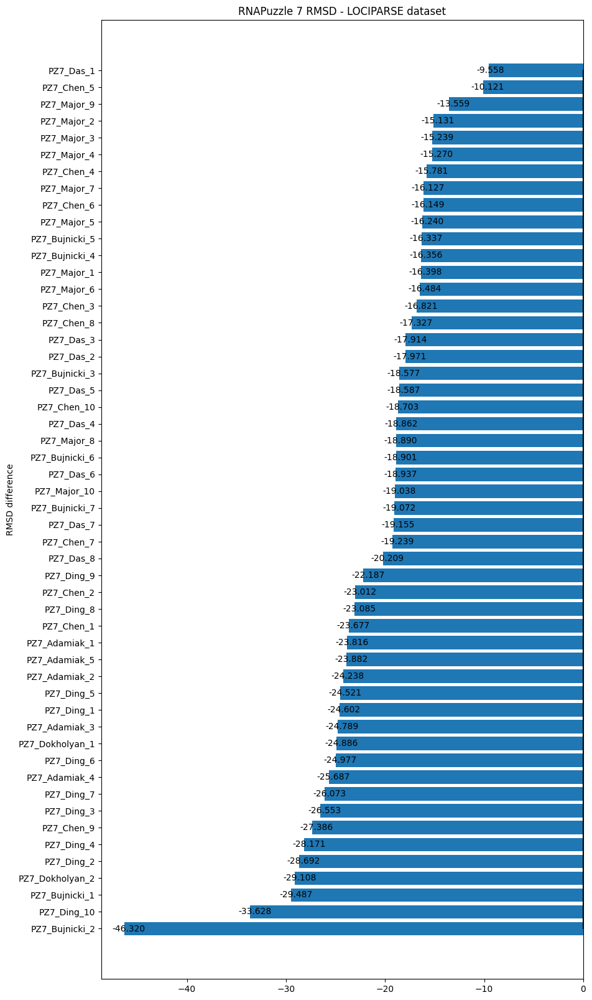

None

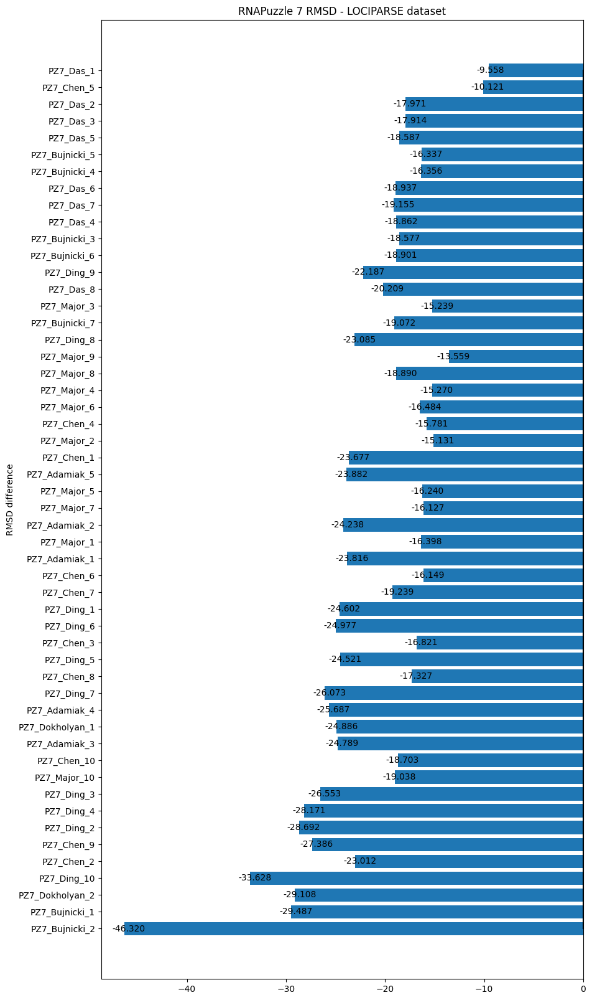

None

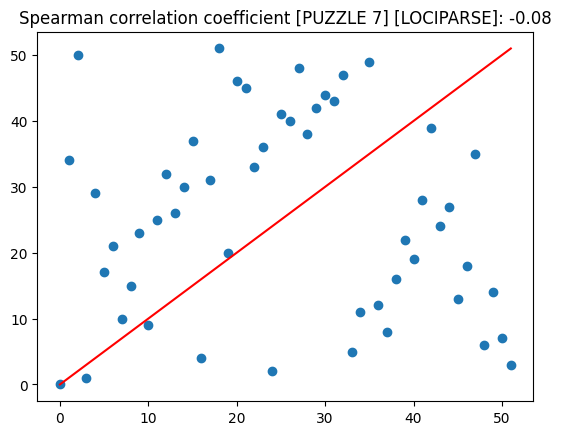

None

'PUZZLE: 22'

'MAE: 19.858502012491225'

'MSE: 411.9833571788623'

'MEDIAN: 20.23904311656952'

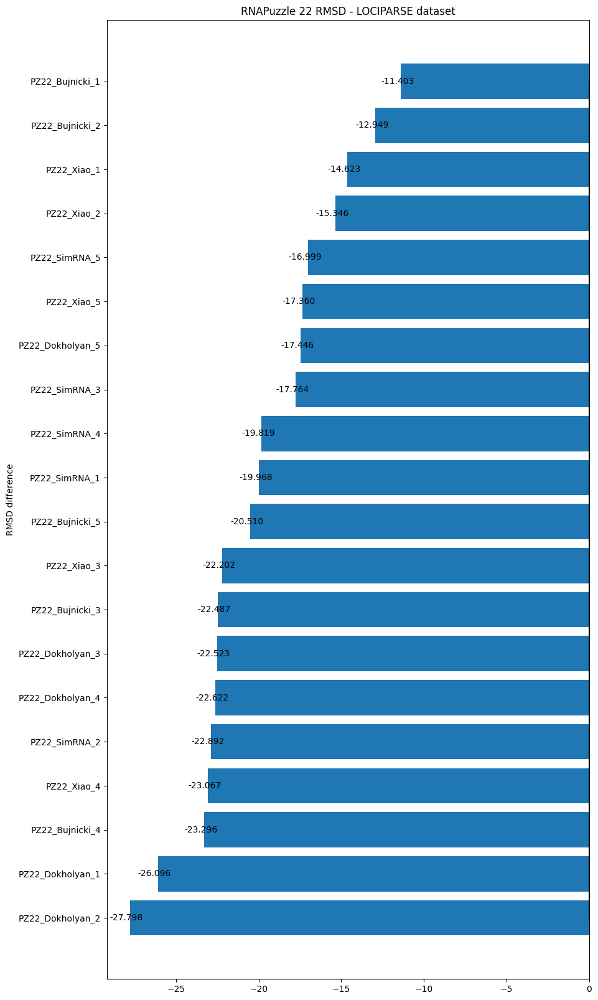

None

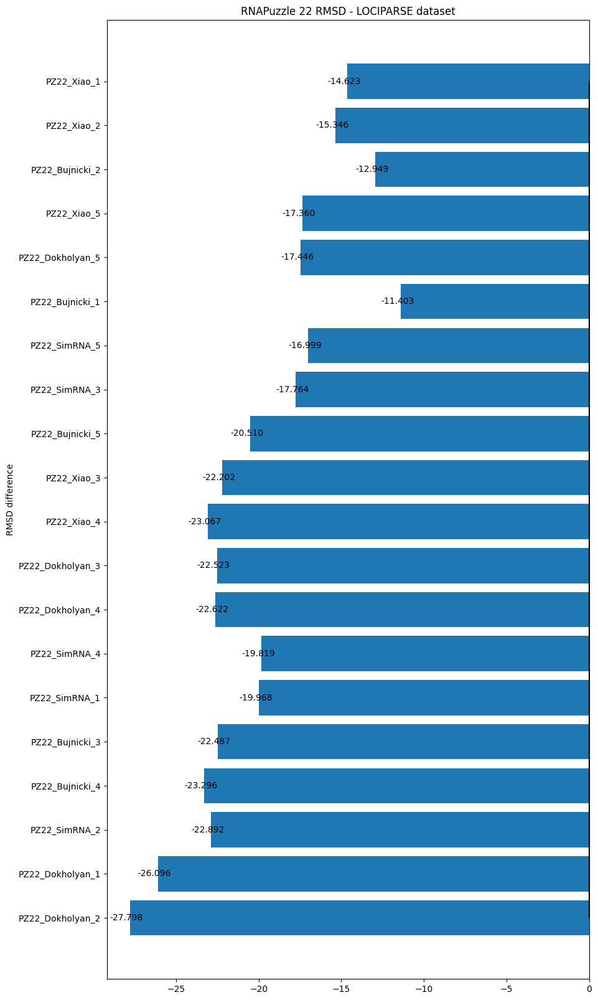

None

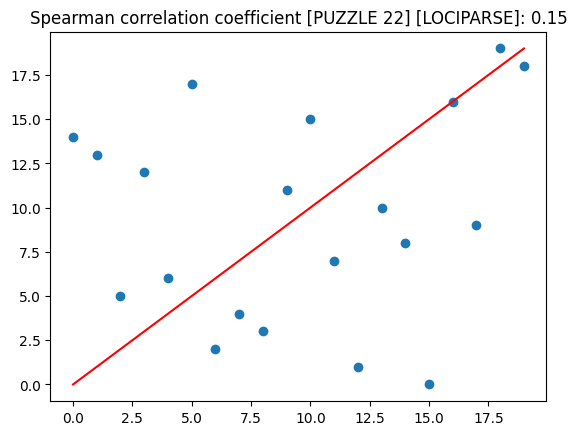

None

'PUZZLE: 35'

'MAE: 10.198214713264914'

'MSE: 137.92427343390895'

'MEDIAN: 10.097546577453613'

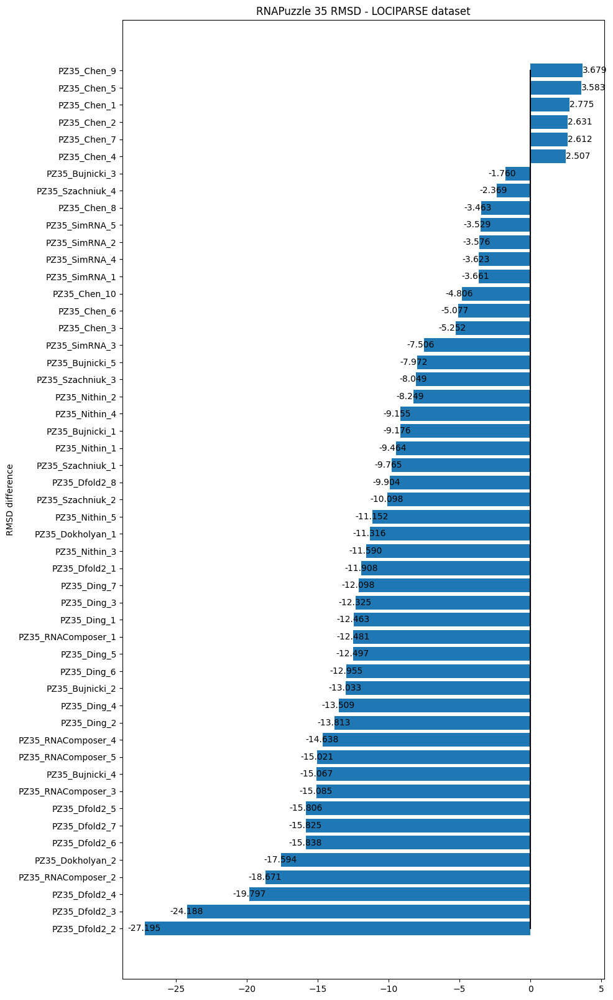

None

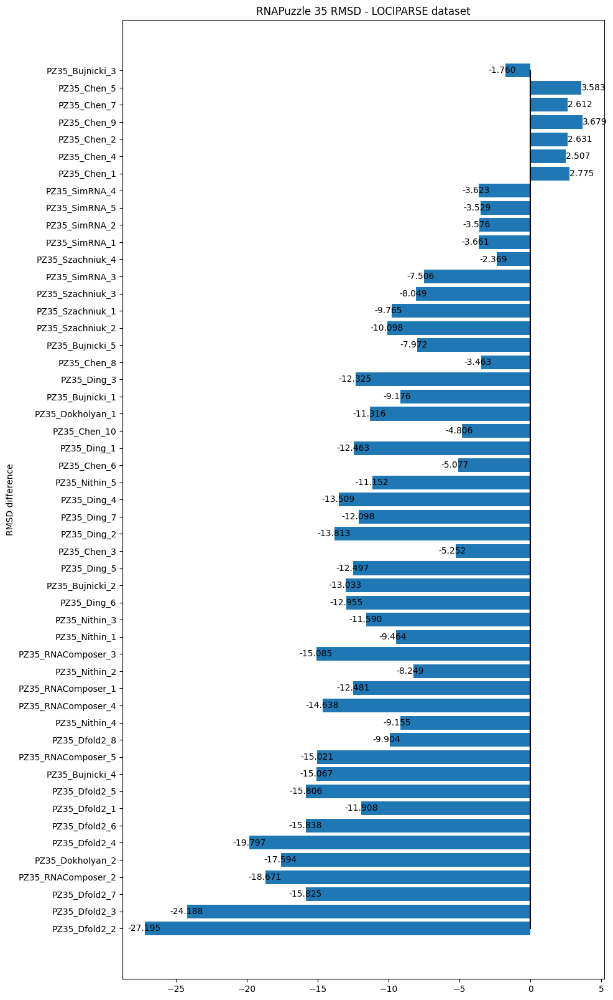

None

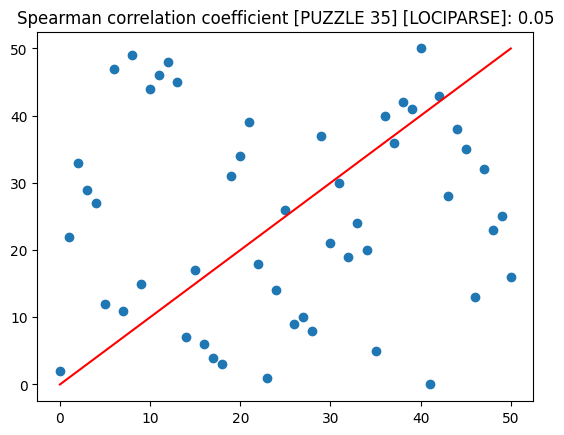

None

'PUZZLE: 32'

'MAE: 11.325077111990947'

'MSE: 162.25484947458696'

'MEDIAN: 10.25123929977417'

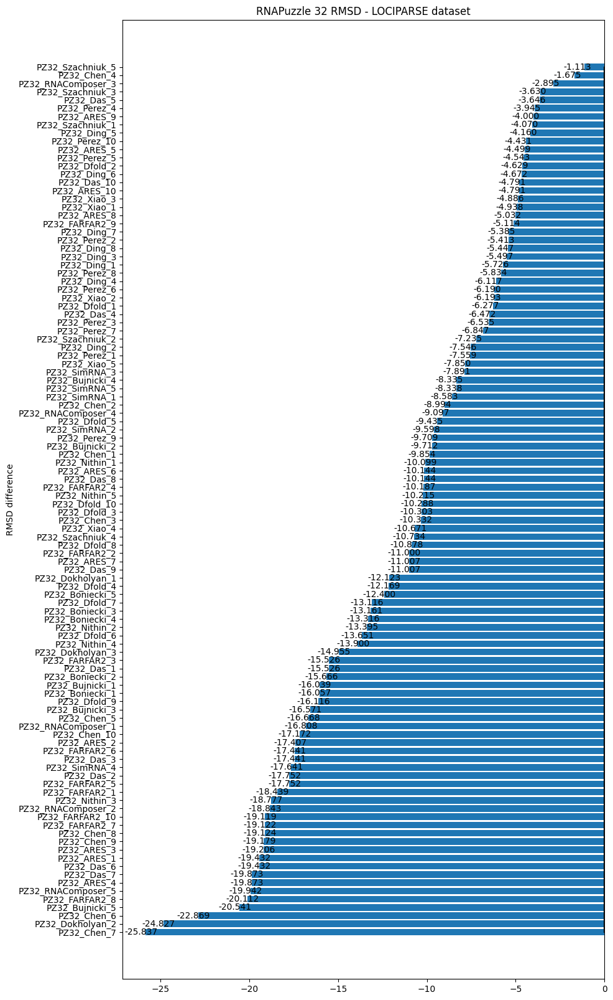

None

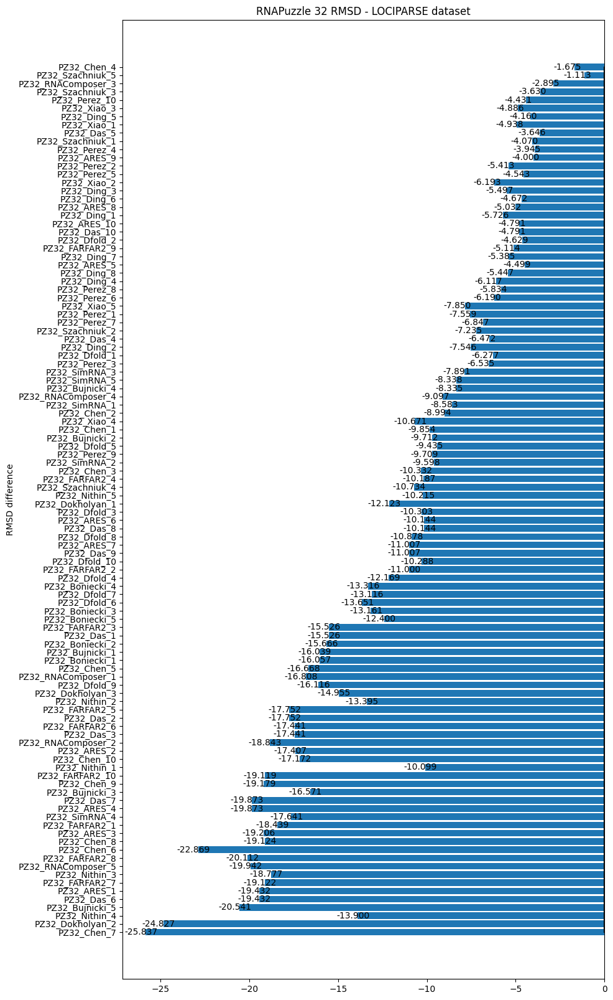

None

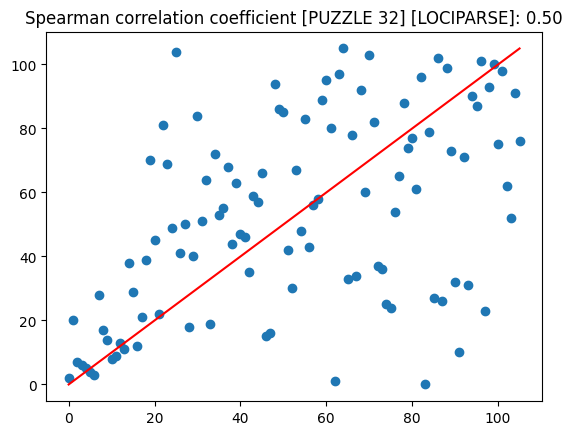

None

'PUZZLE: 37'

'MAE: 11.910080710579367'

'MSE: 164.58071887711097'

'MEDIAN: 11.770419836044312'

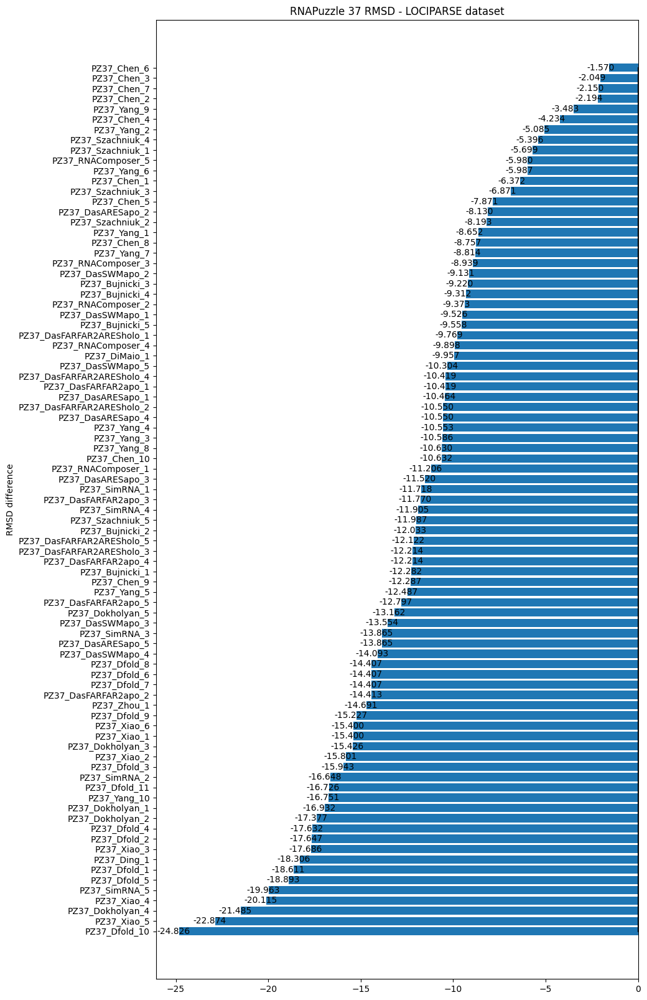

None

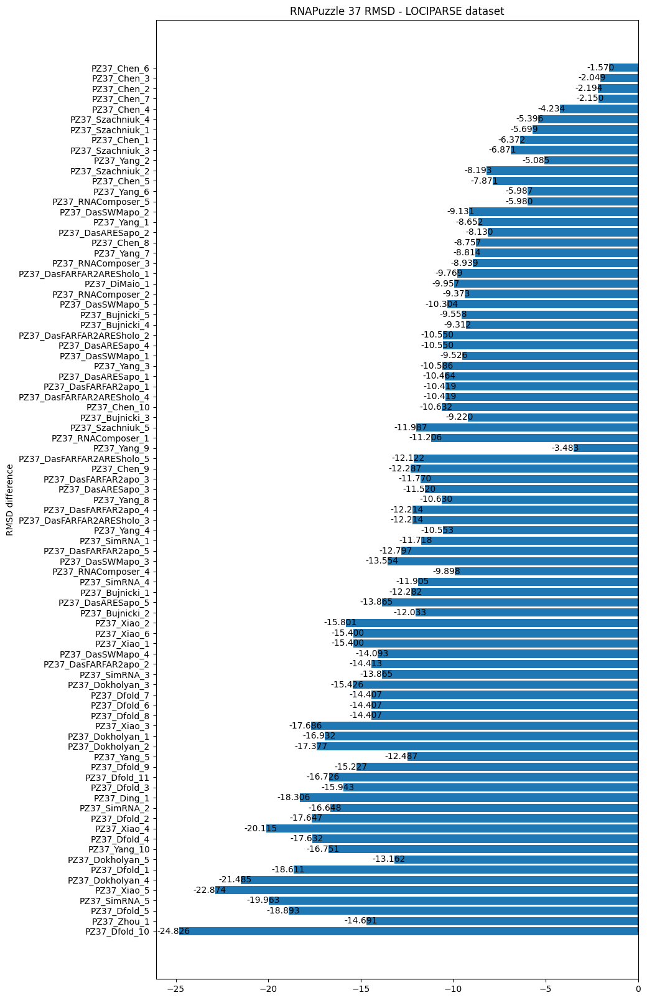

None

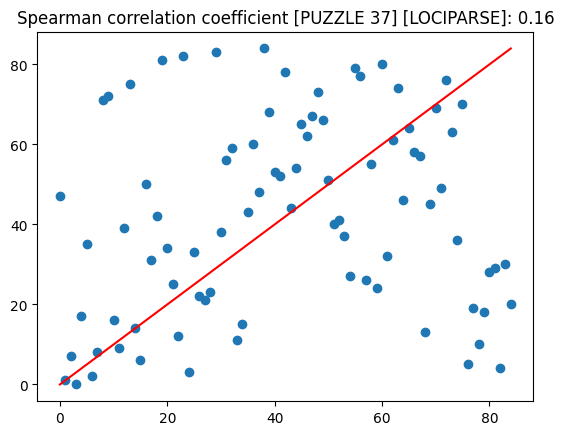

None

'PUZZLE: 25'

'MAE: 3.50815804968489'

'MSE: 25.81275320708376'

'MEDIAN: 2.823011875152588'

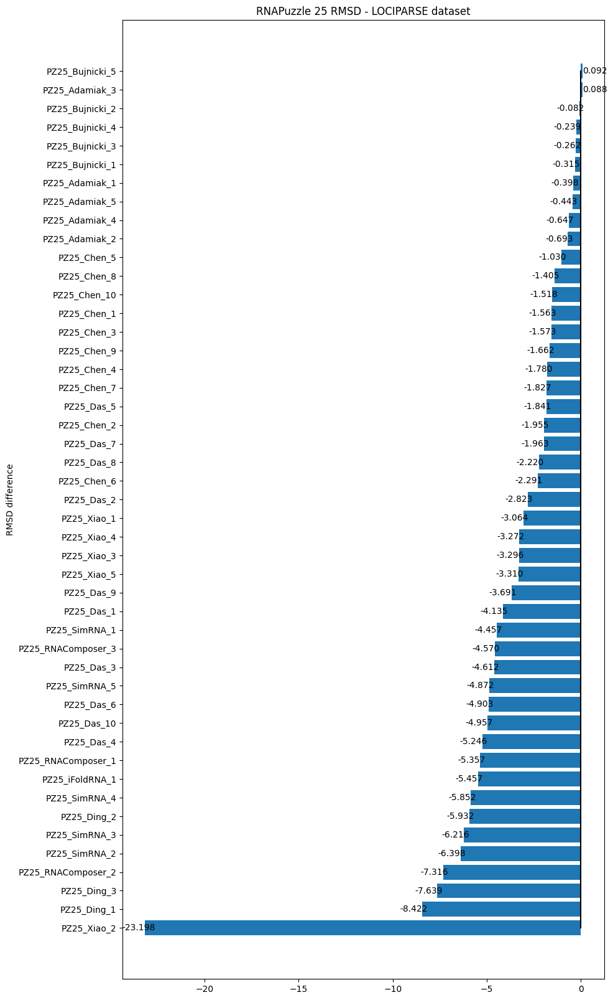

None

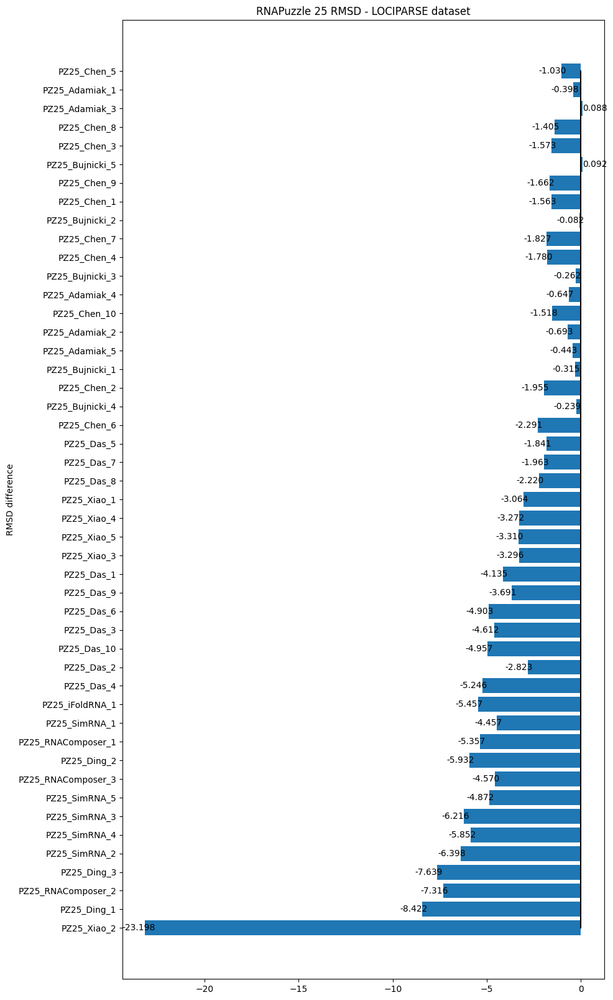

None

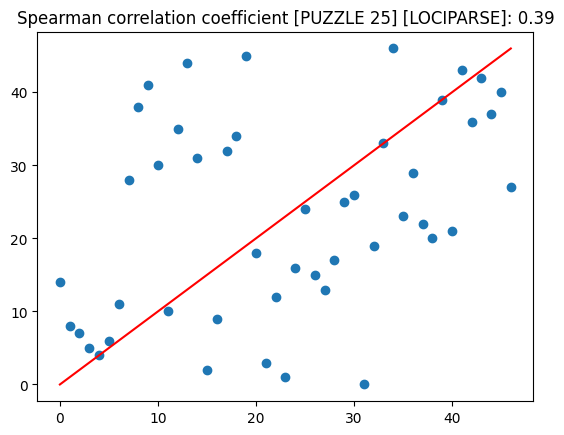

None

'PUZZLE: 18'

'MAE: 11.954738251624569'

'MSE: 182.6516448277301'

'MEDIAN: 11.88623732328415'

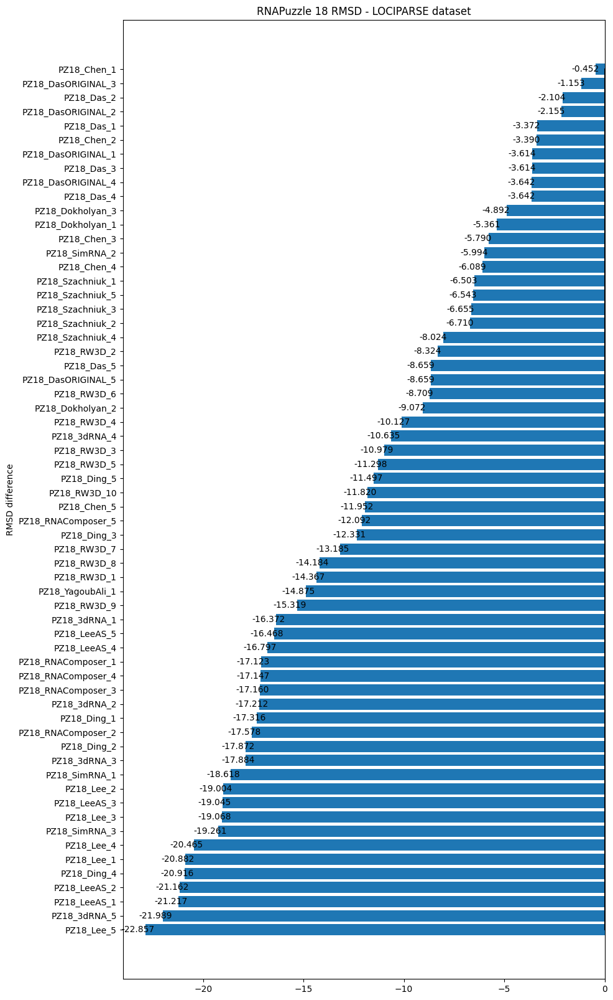

None

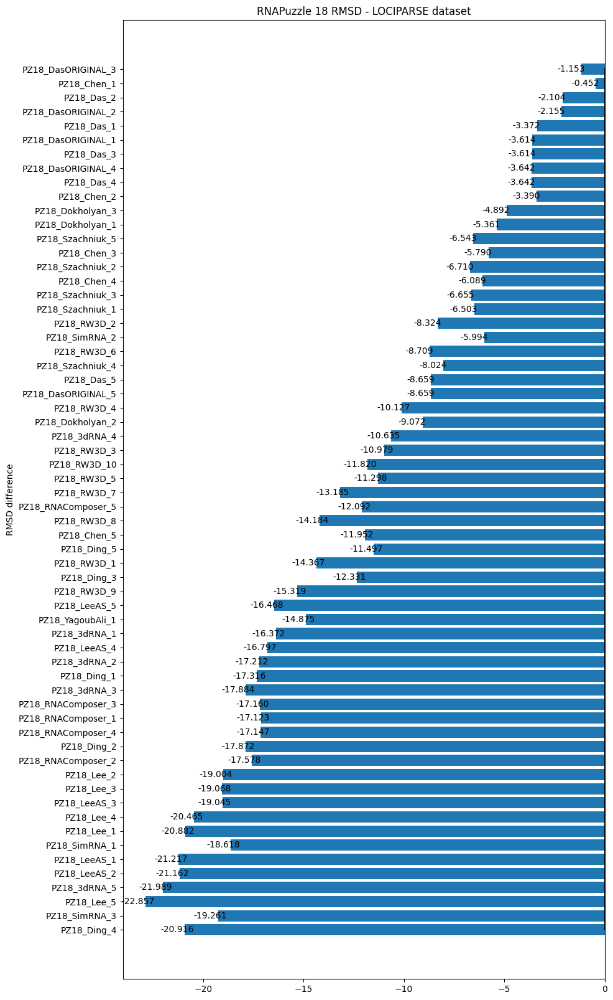

None

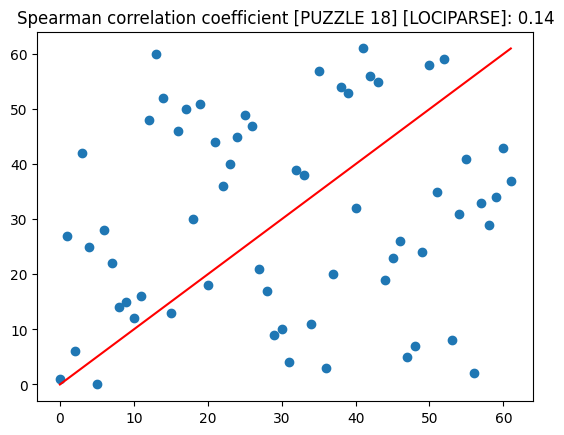

None

'PUZZLE: 15'

'MAE: 8.851091278923882'

'MSE: 126.43772303763298'

'MEDIAN: 6.62074434757233'

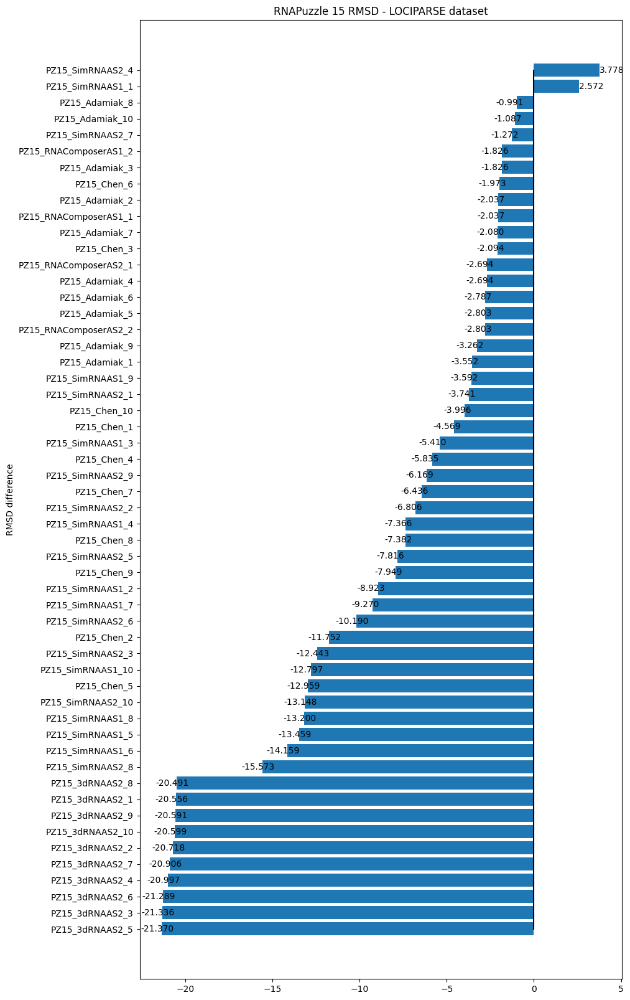

None

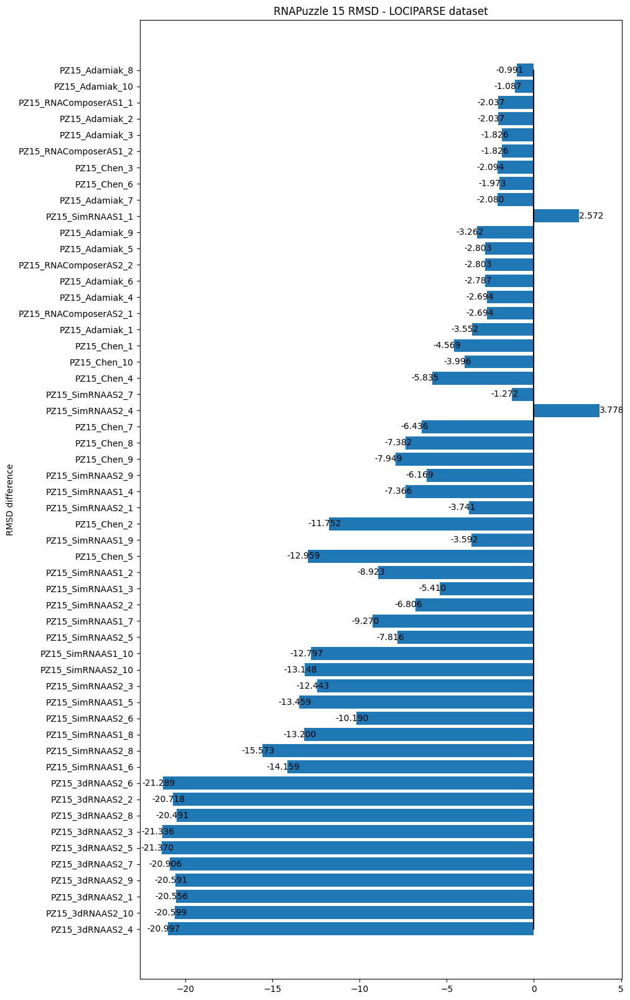

None

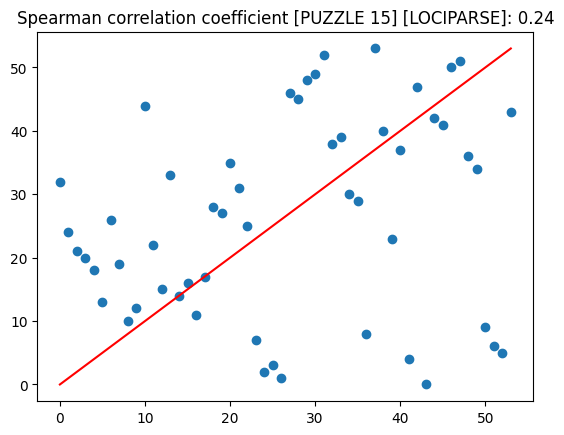

None

'PUZZLE: 9'

'MAE: 7.008871962042416'

'MSE: 68.00224075571262'

'MEDIAN: 6.311887383460999'

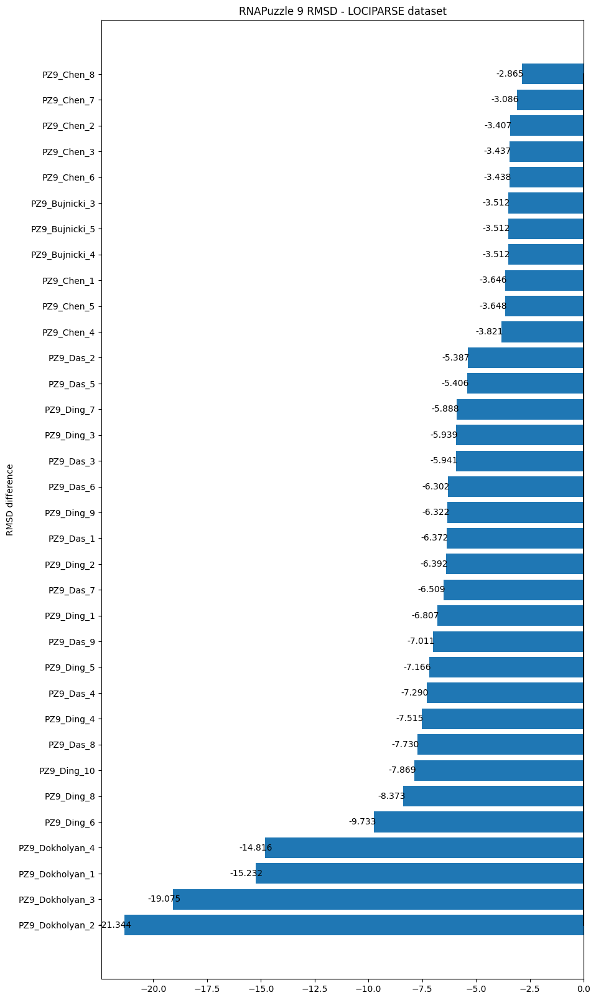

None

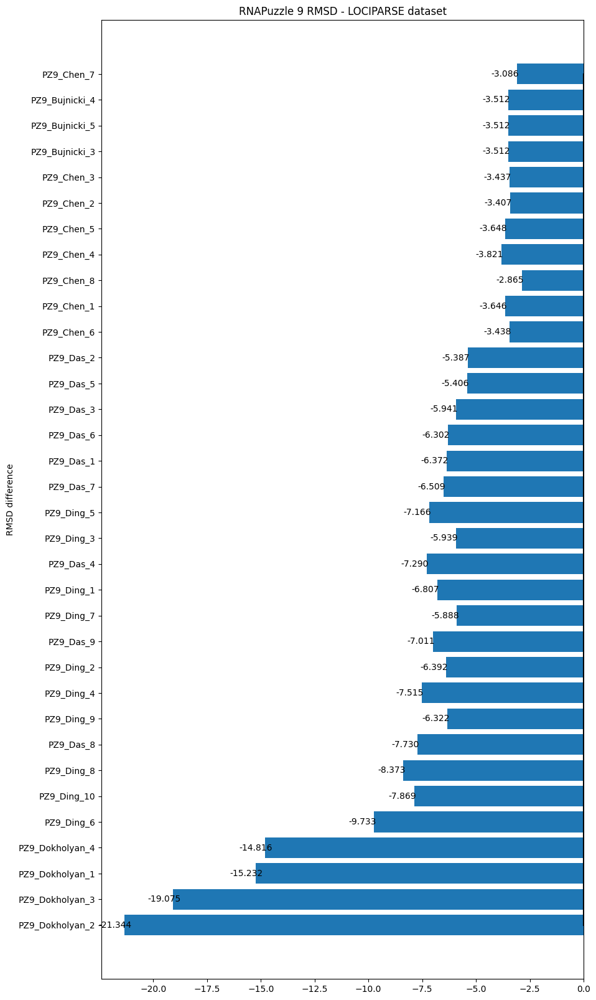

None

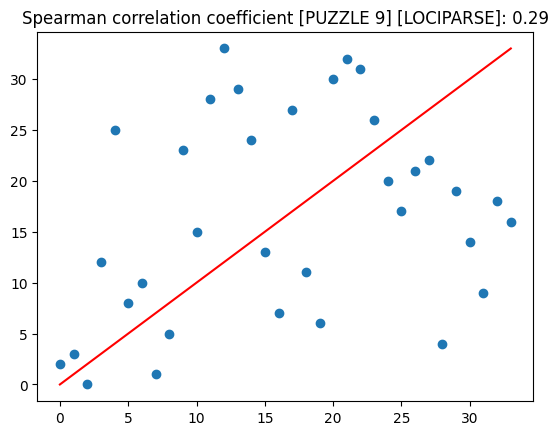

None

'PUZZLE: 8'

'MAE: 9.783671205952054'

'MSE: 110.0160471173255'

'MEDIAN: 9.393768787384033'

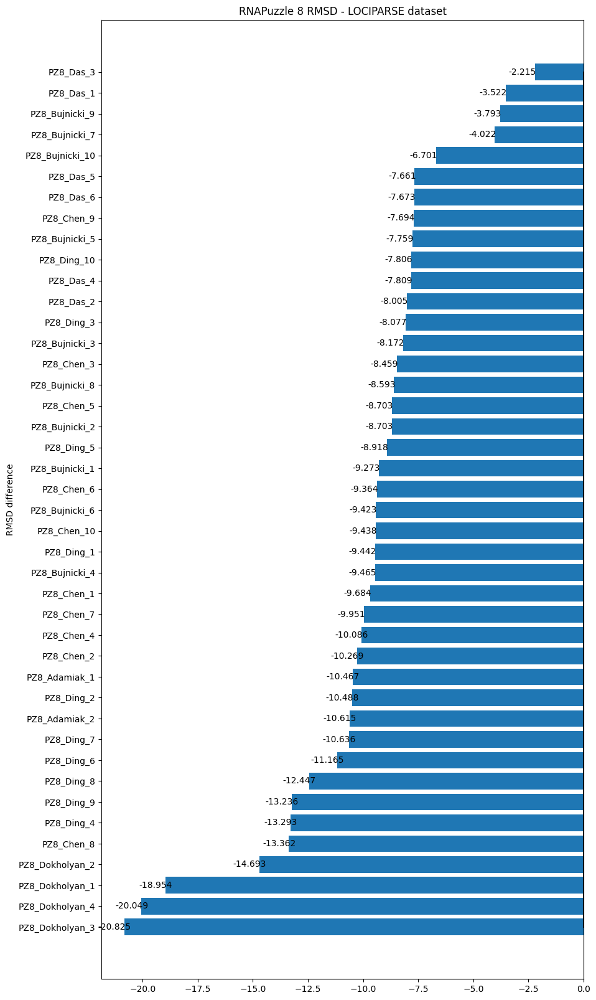

None

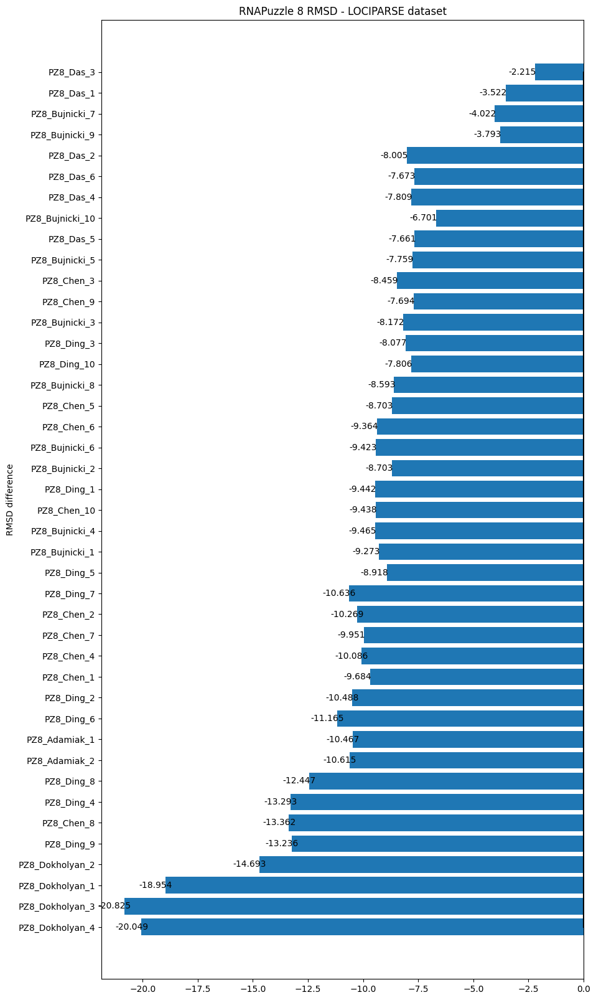

None

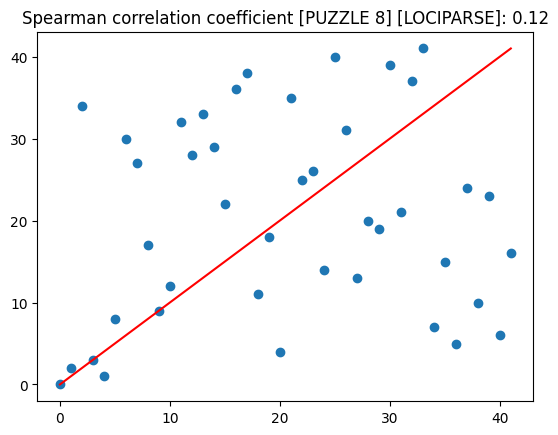

None

'PUZZLE: 28'

'MAE: 2.912517714831564'

'MSE: 24.396932670351664'

'MEDIAN: 1.1757482290267944'

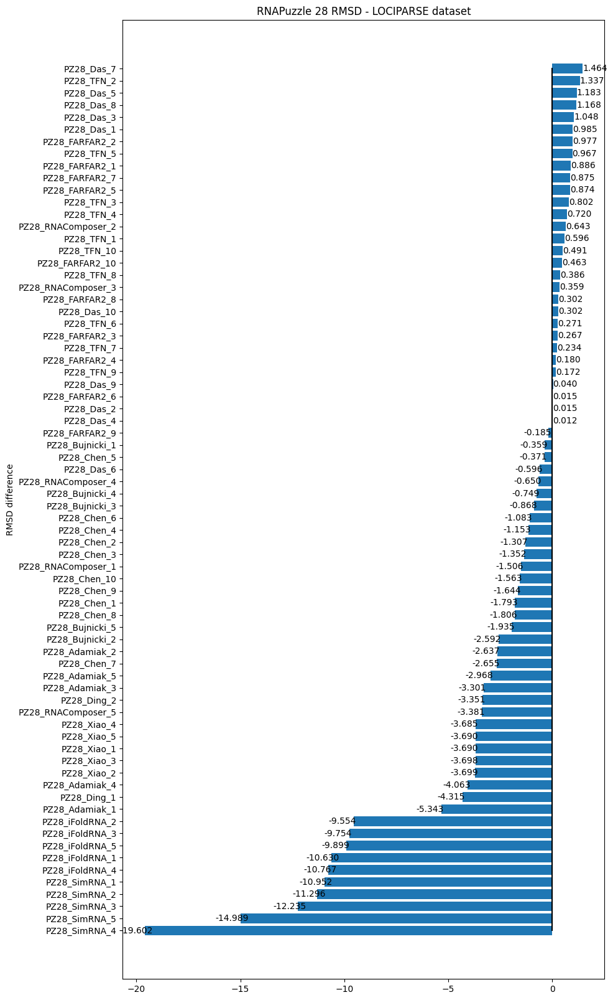

None

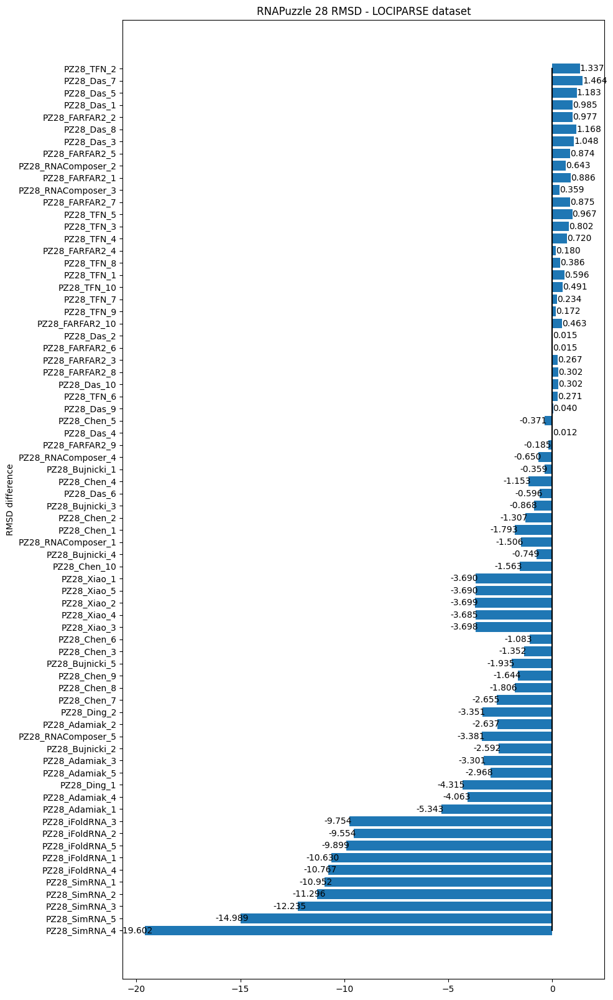

None

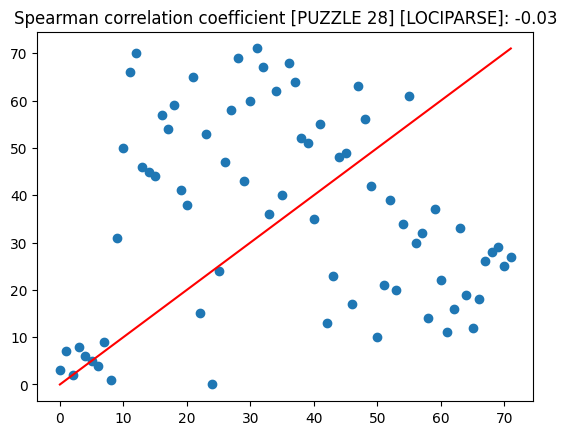

None

'PUZZLE: 19'

'MAE: 8.677717617002584'

'MSE: 96.0663680842942'

'MEDIAN: 8.065921306610107'

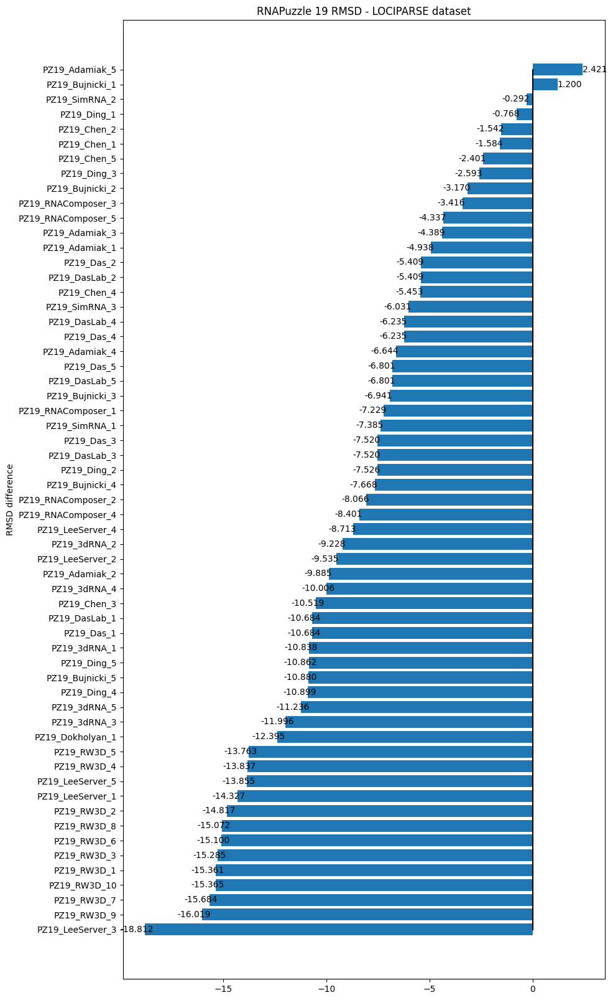

None

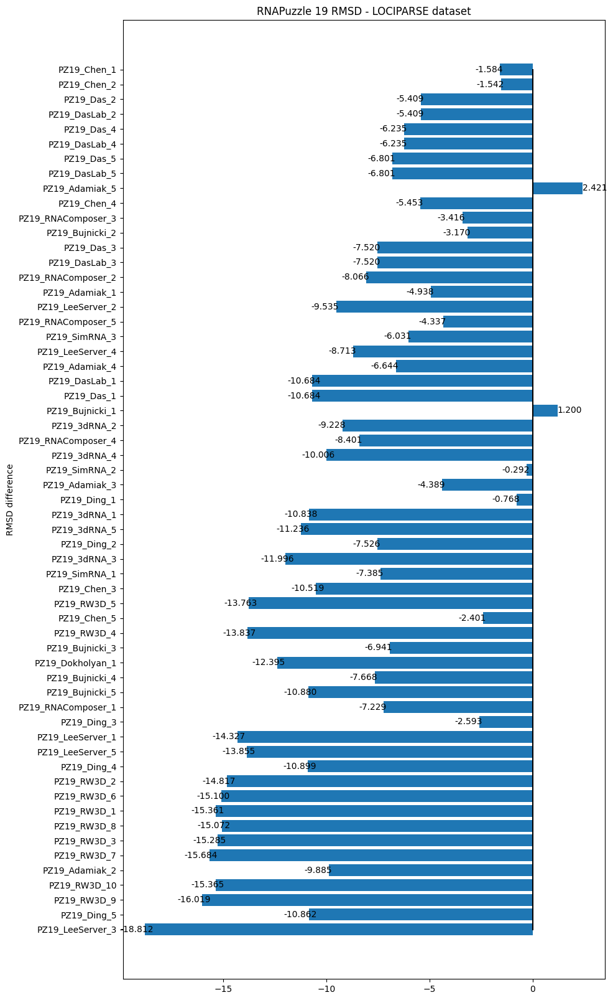

None

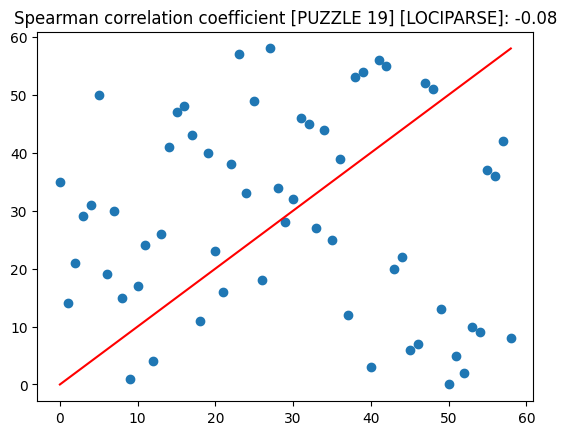

None

'PUZZLE: 38'

'MAE: 9.715809435457796'

'MSE: 104.58595480042388'

'MEDIAN: 9.702738523483276'

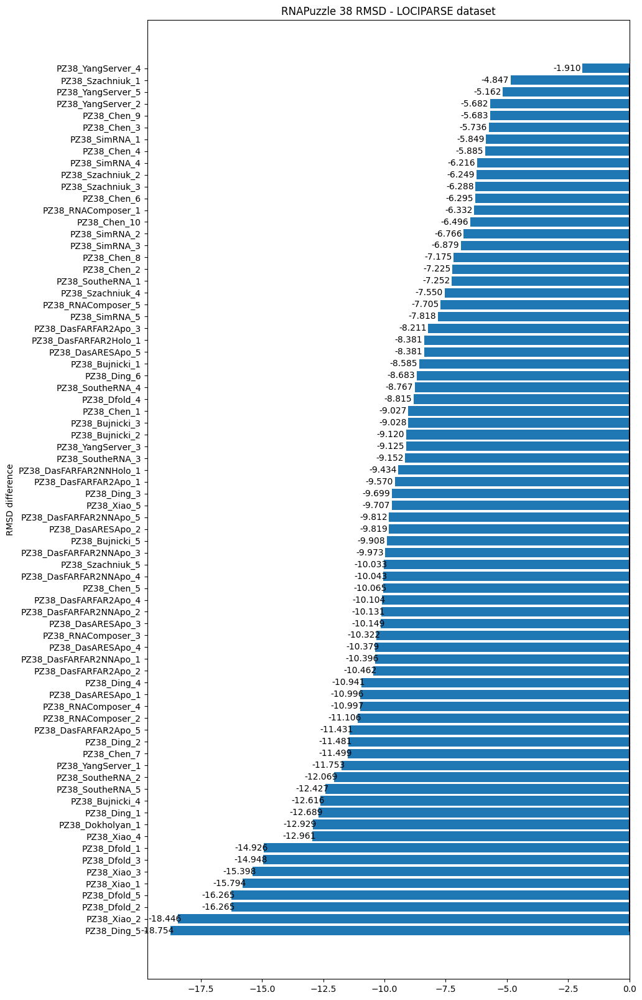

None

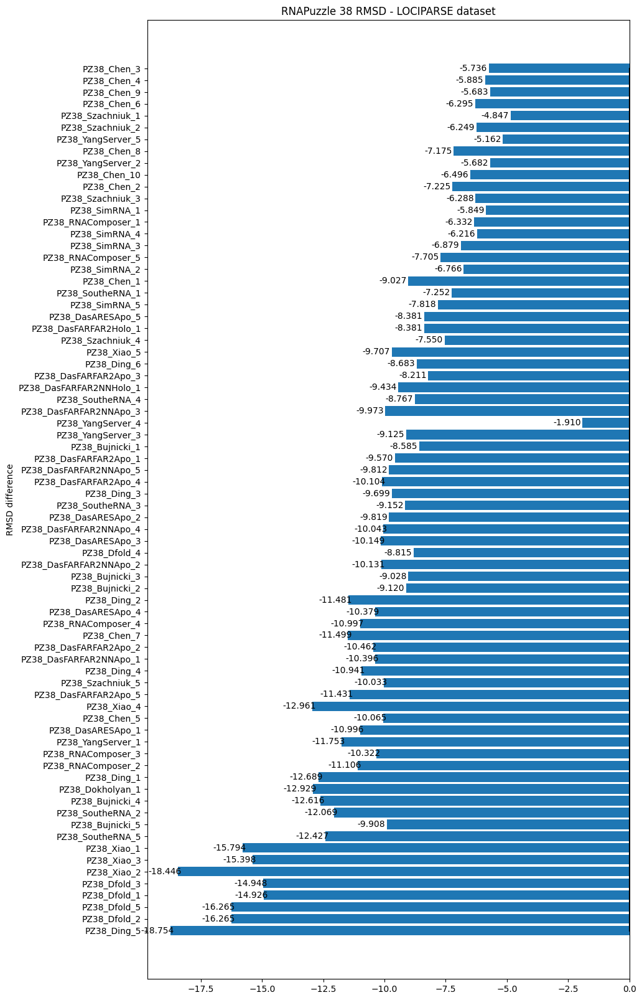

None

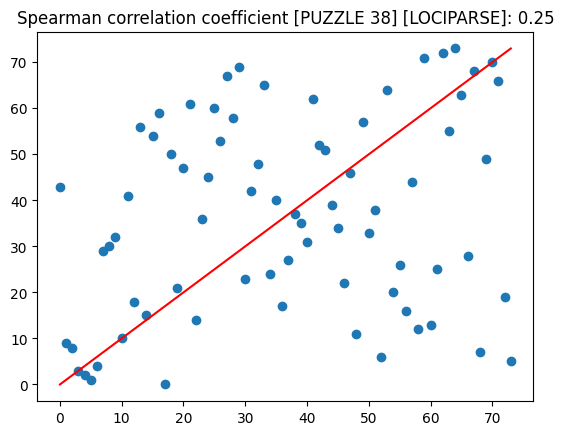

None

'PUZZLE: 36'

'MAE: 9.427403962973392'

'MSE: 115.10668718269869'

'MEDIAN: 9.485825538635252'

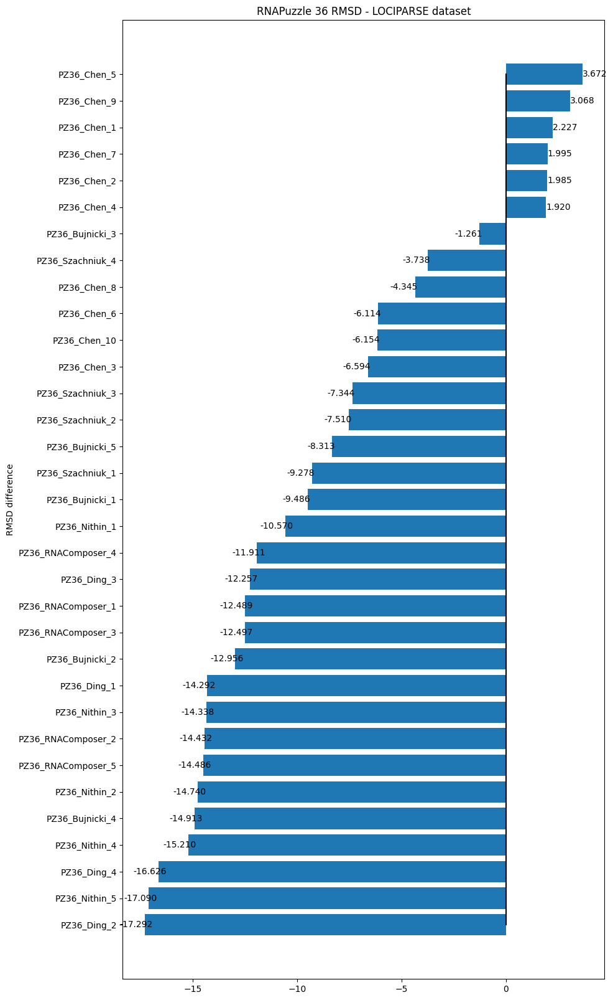

None

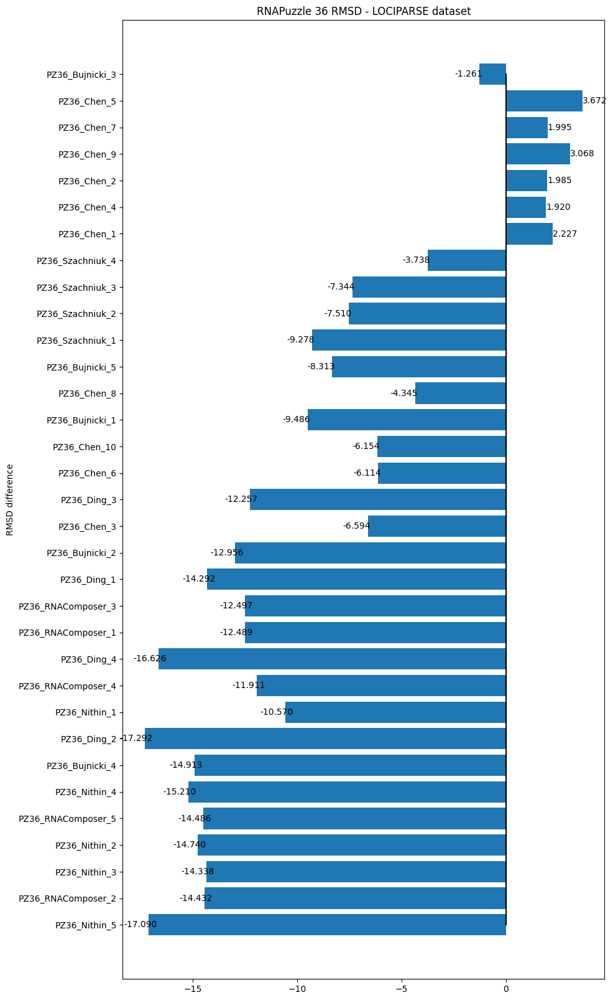

None

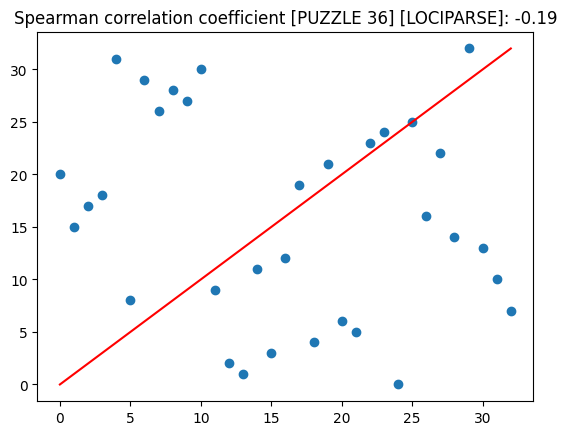

None

'PUZZLE: 23'

'MAE: 8.961250029291426'

'MSE: 85.96179567241013'

'MEDIAN: 9.227877974510193'

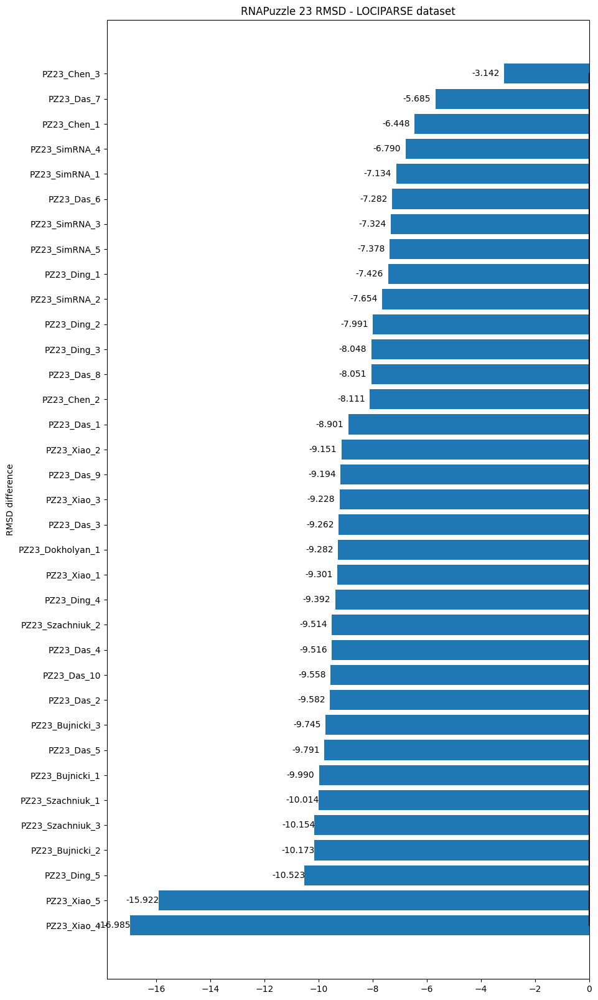

None

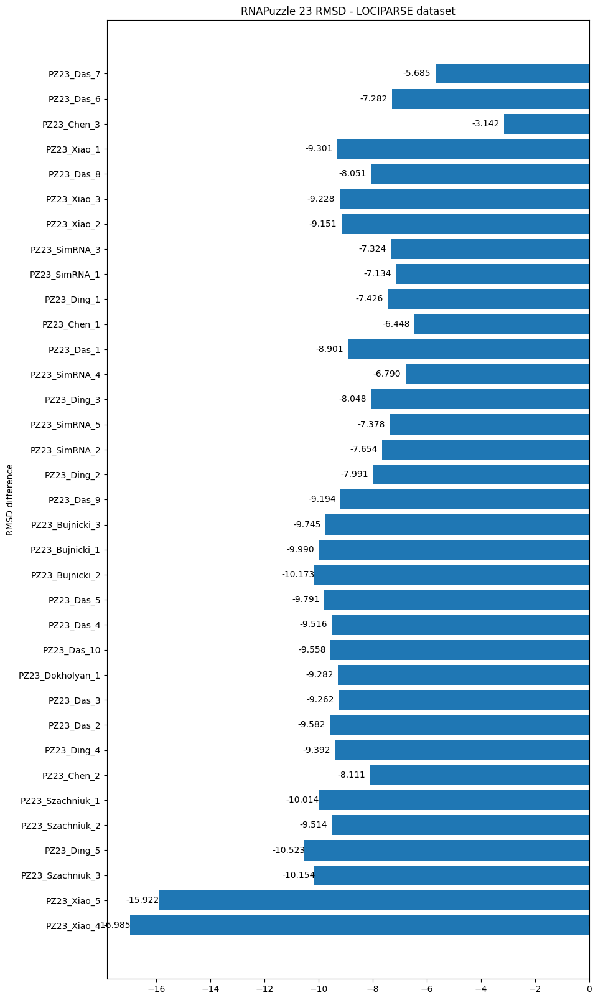

None

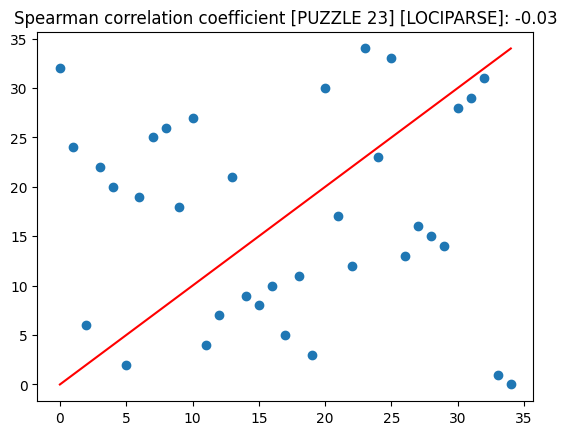

None

'PUZZLE: 21'

'MAE: 7.894958283941625'

'MSE: 95.0051275441754'

'MEDIAN: 8.193182706832886'

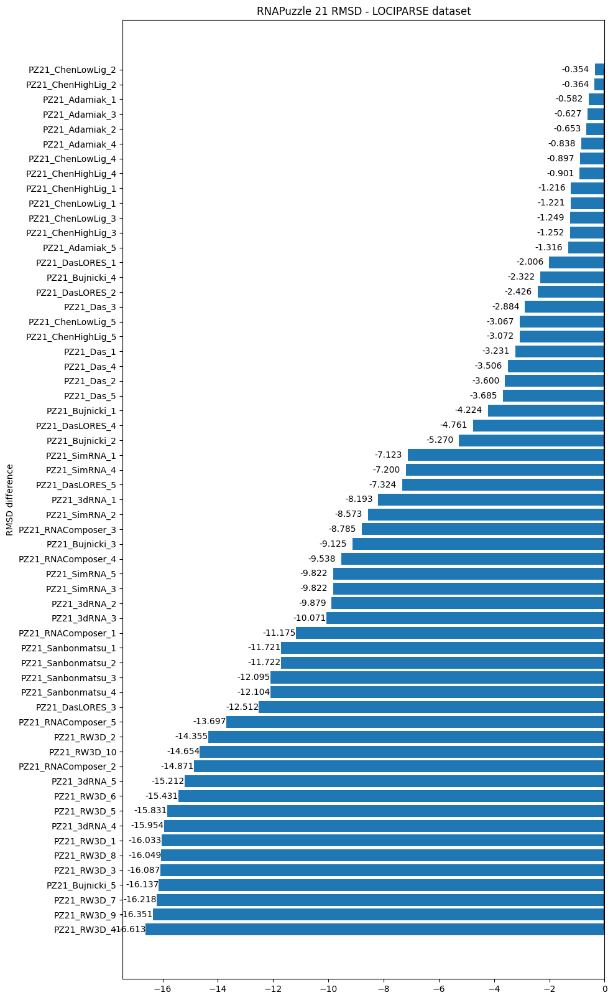

None

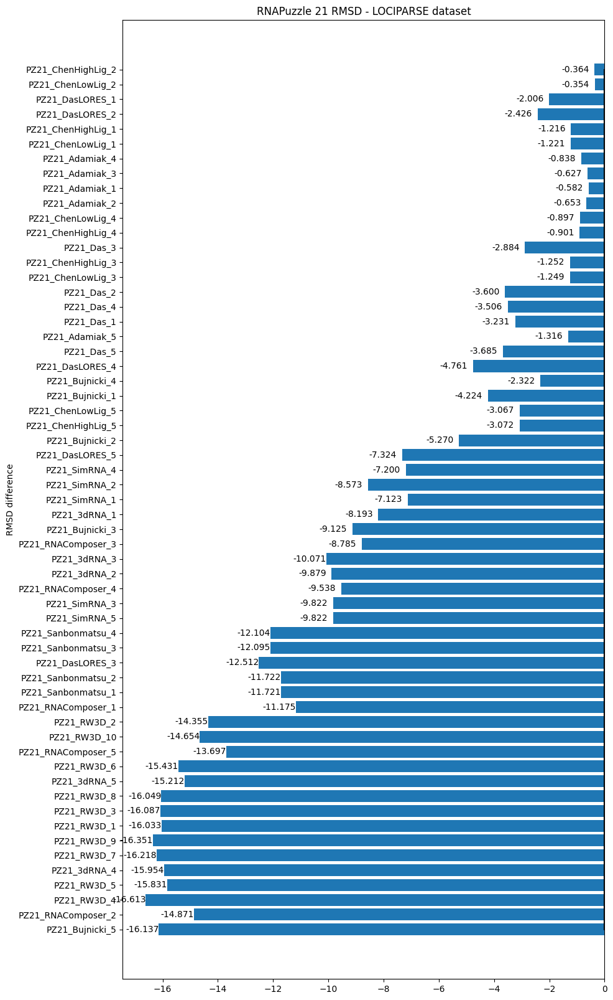

None

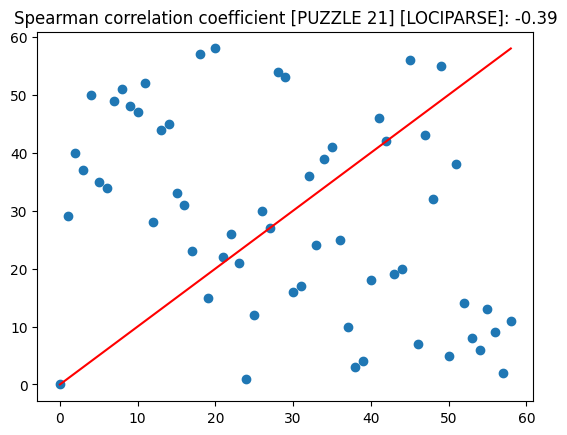

None

'PUZZLE: 14Bound'

'MAE: 8.61289406940341'

'MSE: 85.35372745879066'

'MEDIAN: 9.17217481136322'

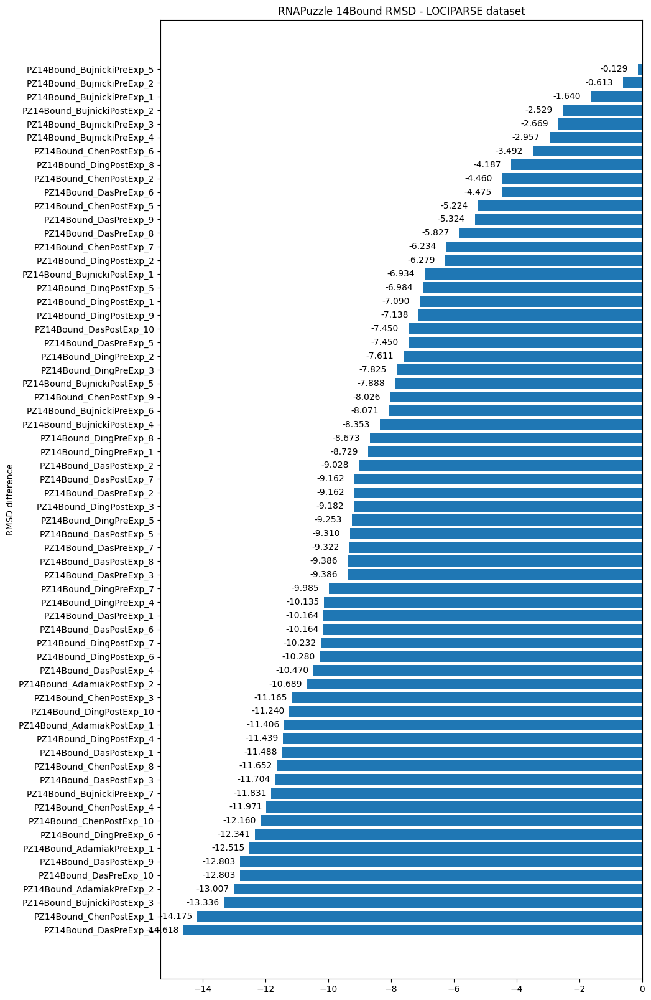

None

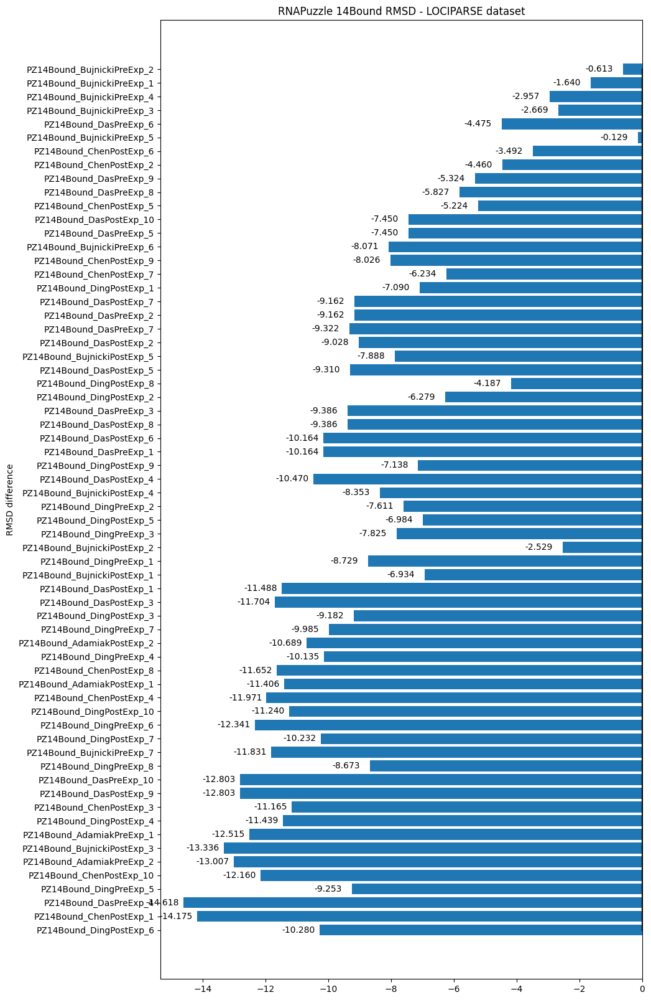

None

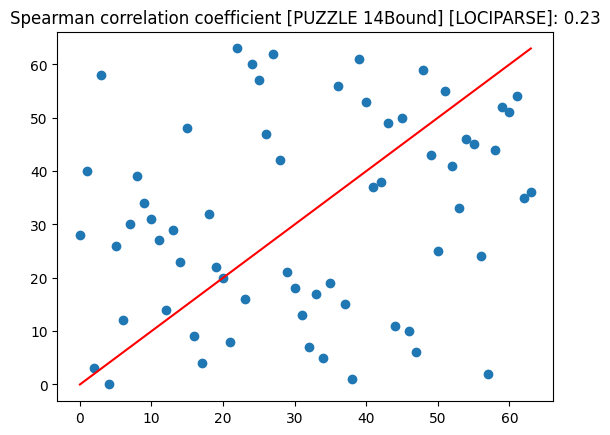

None

'PUZZLE: 29'

'MAE: 5.22551707426707'

'MSE: 35.30058067401046'

'MEDIAN: 4.297317862510681'

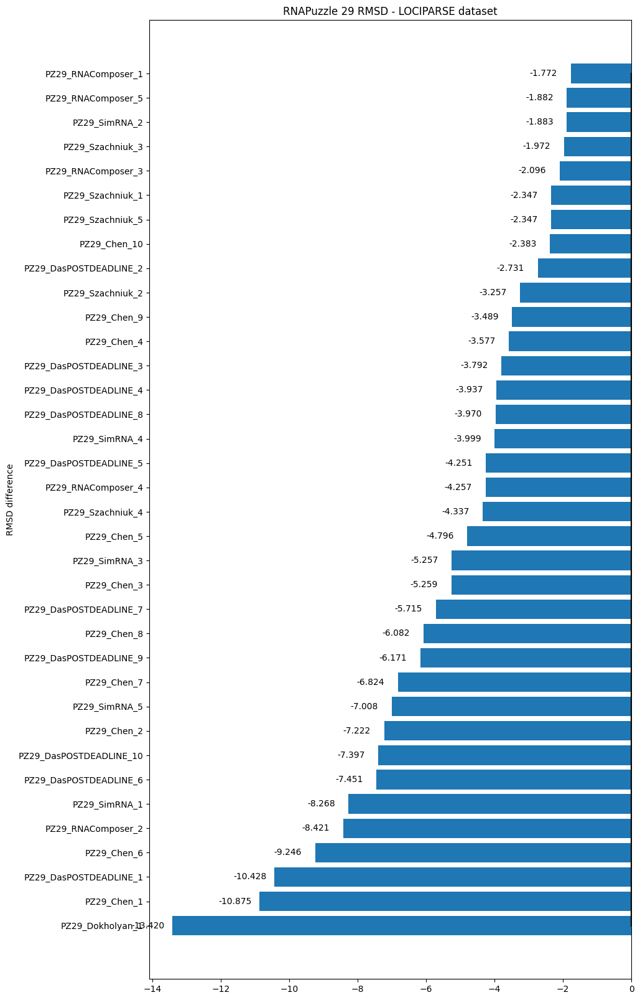

None

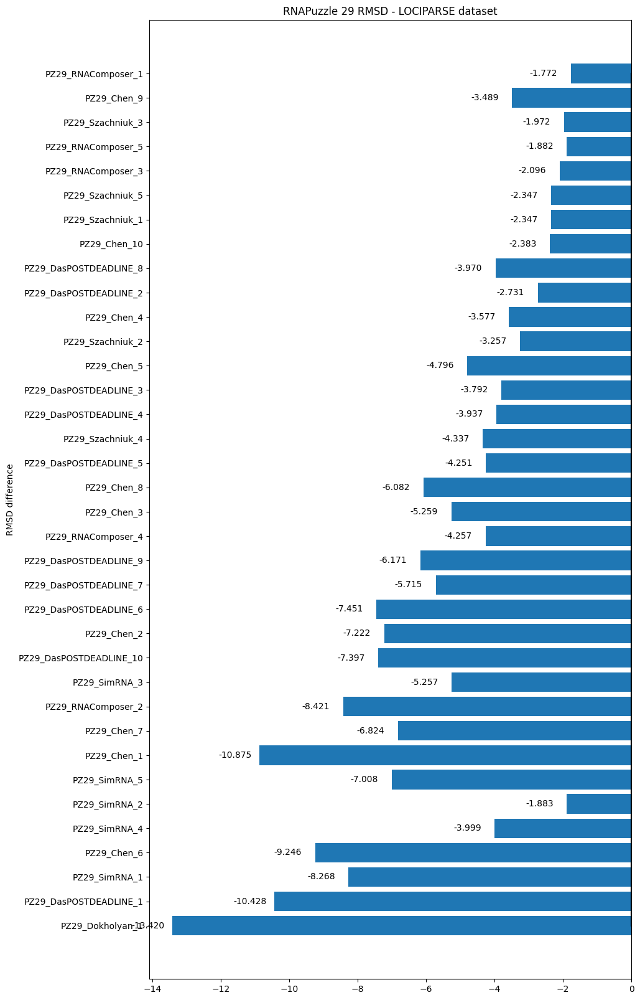

None

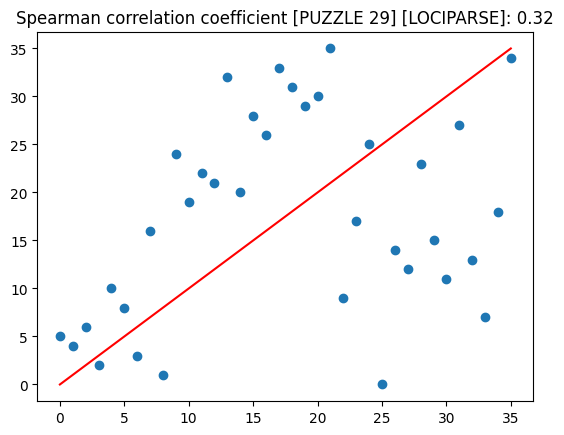

None

'PUZZLE: 20'

'MAE: 3.9301934401194254'

'MSE: 24.121088991984514'

'MEDIAN: 3.2047830820083614'

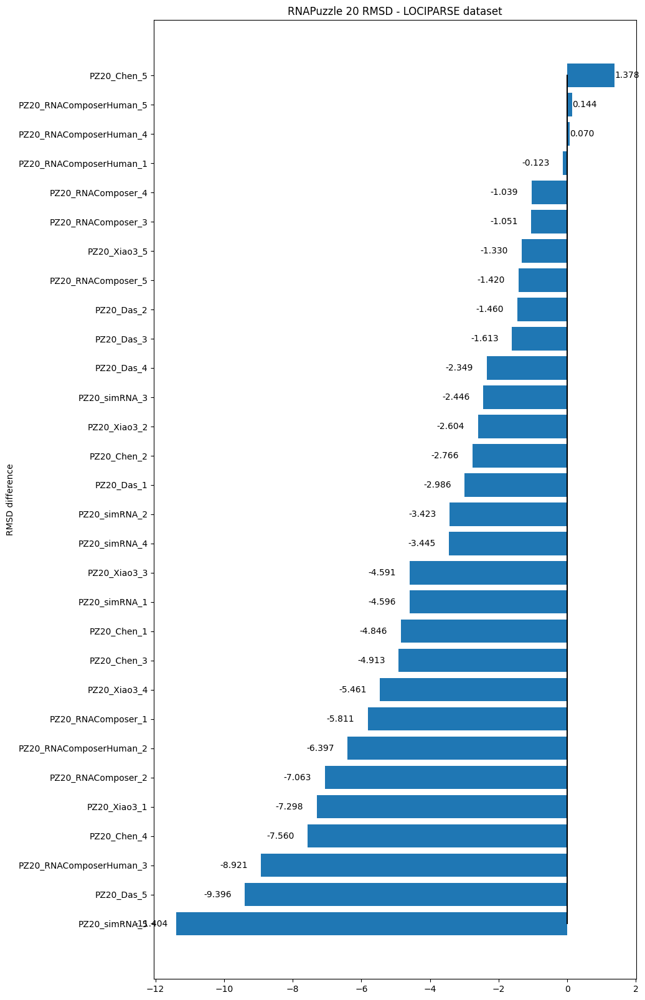

None

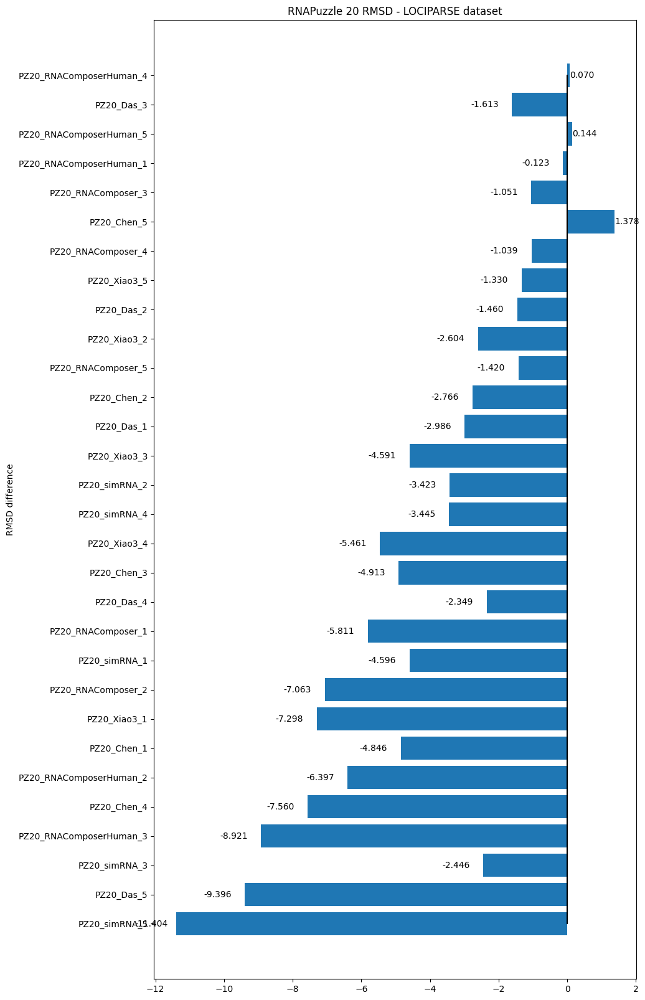

None

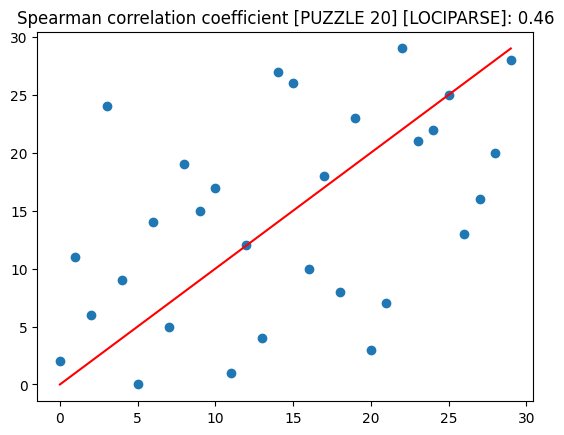

None

'PUZZLE: 4'

'MAE: 0.9591491222381592'

'MSE: 2.58539880983321'

'MEDIAN: 0.6343626976013188'

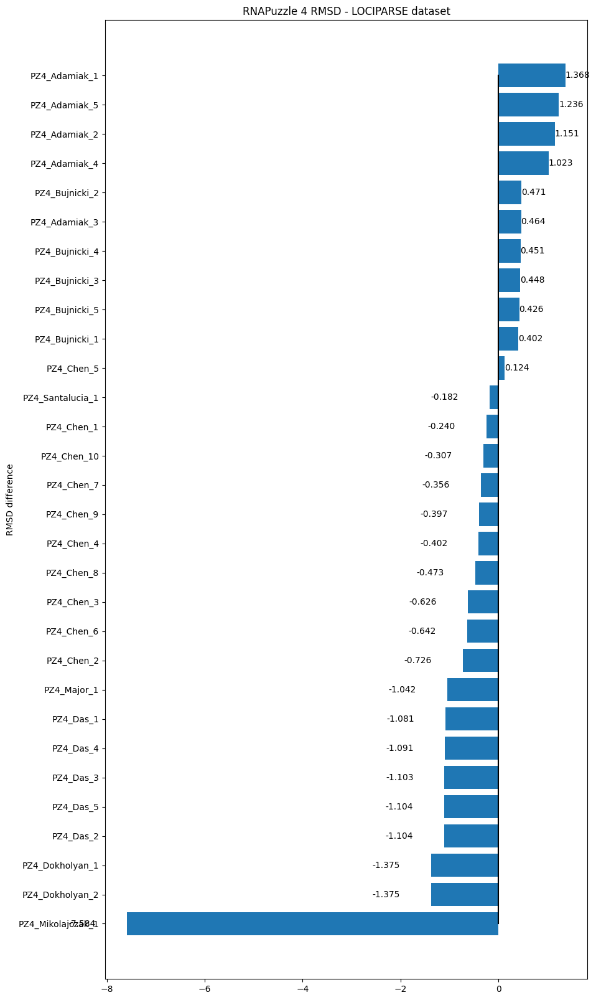

None

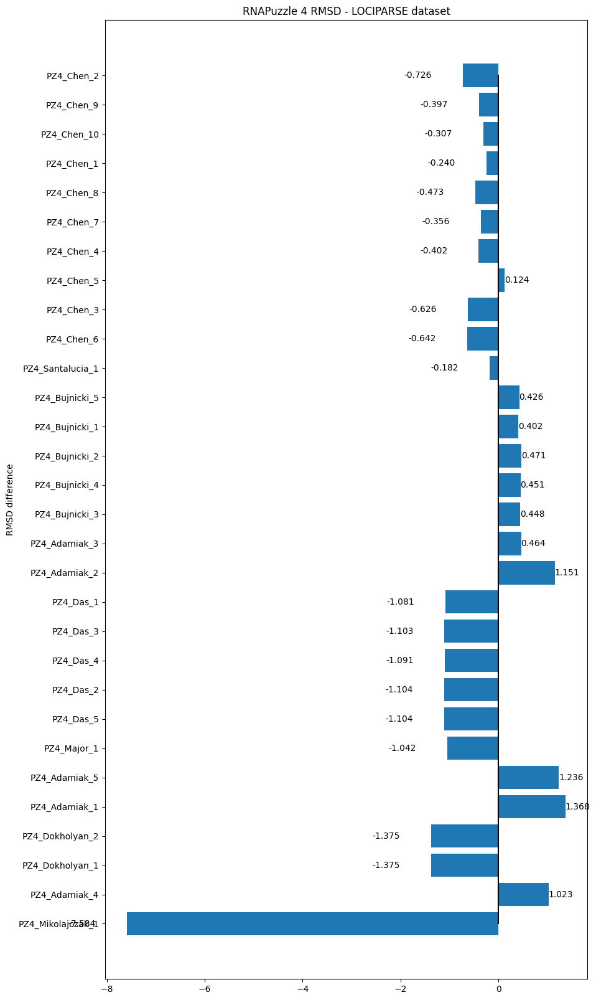

None

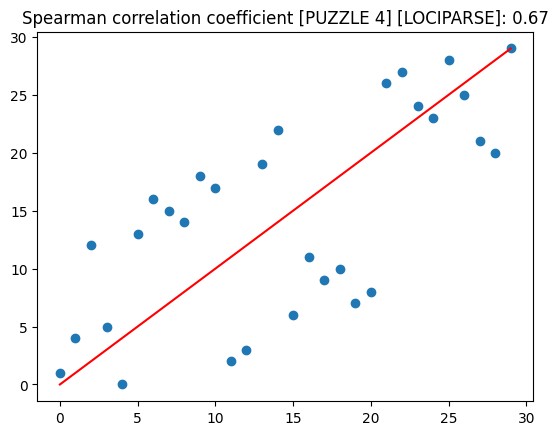

None

'PUZZLE: 1'

'MAE: 1.1909360488255818'

'MSE: 1.8999594956665742'

'MEDIAN: 1.0506185293197632'

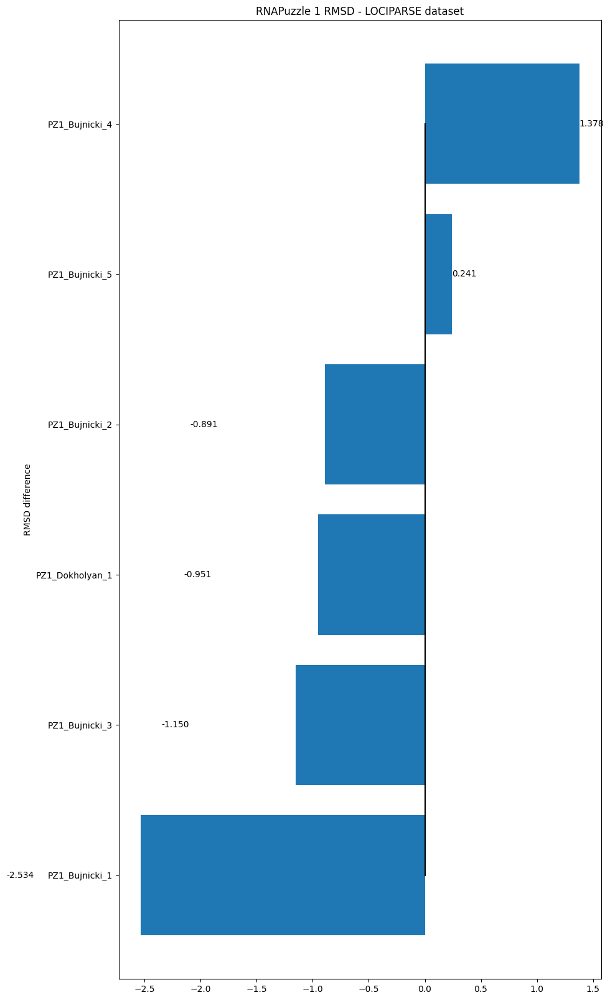

None

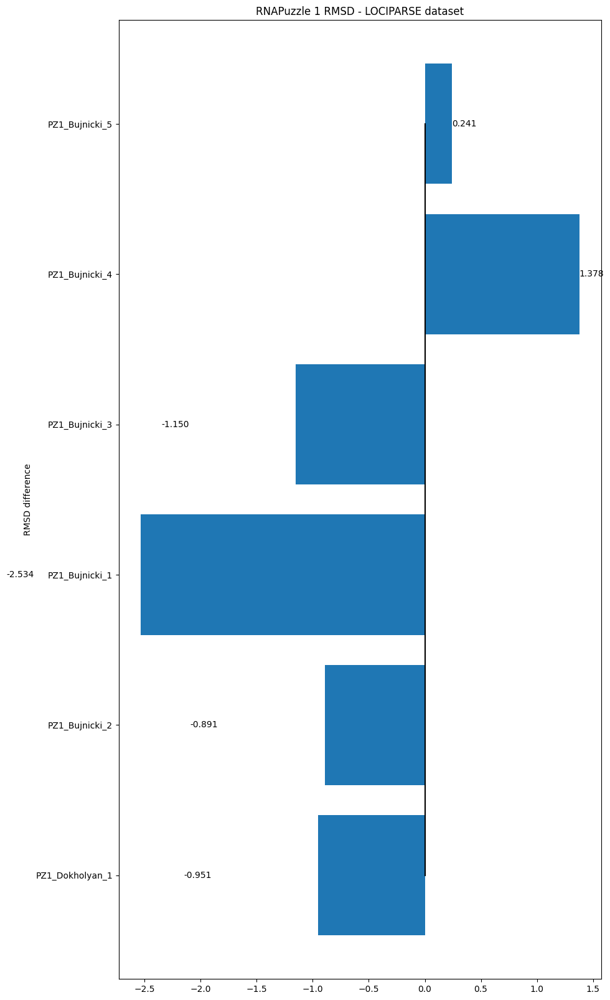

None

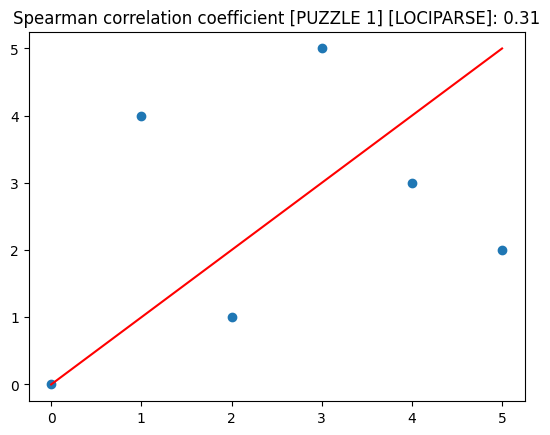

None

'PUZZLE: 2'

'MAE: 0.34272837638854964'

'MSE: 0.1332256078434094'

'MEDIAN: 0.41962432861328125'

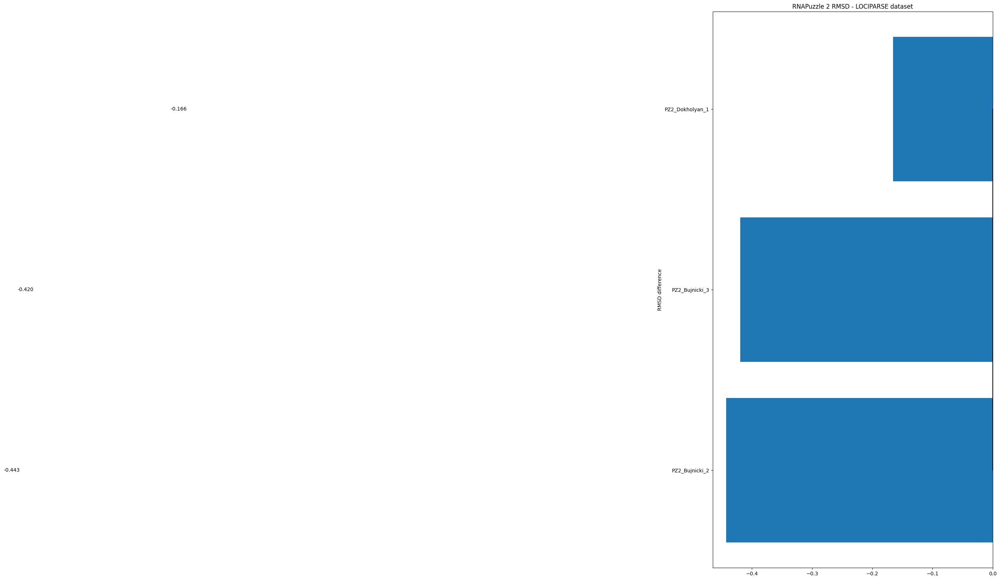

None

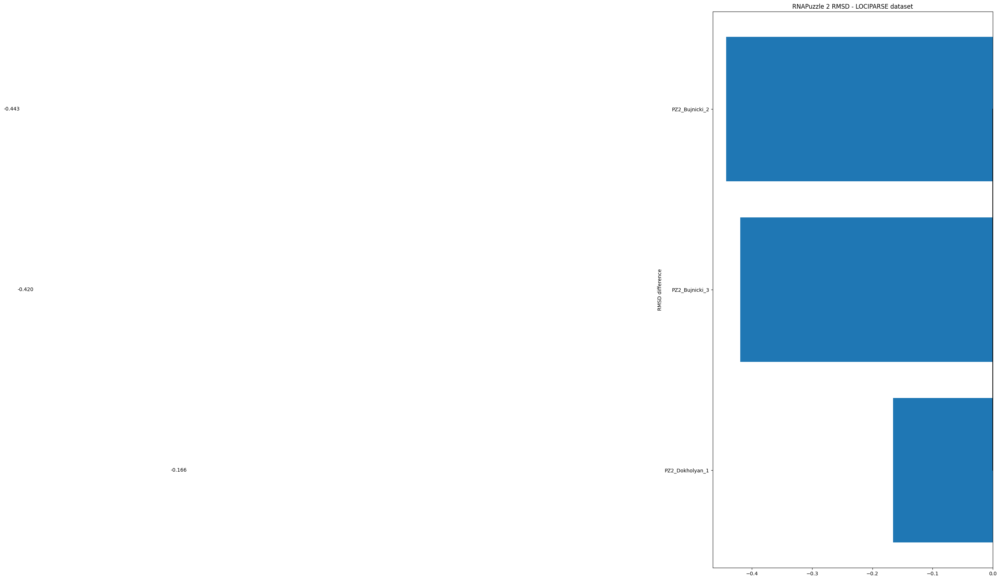

None

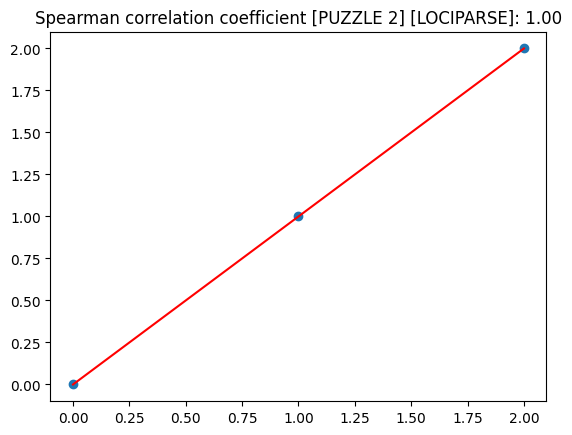

None

In [18]:
final_summary = pd.DataFrame(
    [],
    columns=[
        "MAE",
        "MSE",
        "MEDIAN",
        "PZ",
        "best_model_path",
        "model_name",
        "spearman_correlation",
    ],
)
for checkpoint in checkpoint_paths:
    by = "diff"
    best_model_path = checkpoint["best_model_path"]
    display(f"Testing {checkpoint['dataset']} with model {best_model_path}")
    result = pd.DataFrame(
        predict_and_save_results(
            dataset_test=dataset_test, best_model_path=best_model_path
        ),
        columns=["length", "error", "name"],
    )
    original = pd.read_csv(
        "/home/adamczykb/rnaquanet/data/00_reference/rnapuzzle/rnapuzzle_rmsd_complete.csv"
    )
    original["Name"] = (
        "PZ"
        + original["PZ"]
        + "_"
        + original["Lab"]
        + "_"
        + original["Num"].astype(int).astype(str).str.lower()
    )
    result = pd.merge(result, original, left_on="name", right_on="Name")
    if result.empty:
        display(f"No results for {checkpoint['dataset']}")
        raise ValueError(
            f"No results for {checkpoint['dataset']}. Please check the model and dataset."
        )
    result["RMSD"] = result["RMSD"].astype(float)
    result["error"] = result["error"].astype(float)
    result["diff"] = result["error"] - result["RMSD"]
    if not os.path.exists(f"{base_path}"):
        os.makedirs(f"{base_path}")
    result.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_results.csv",
        index=False,
    )
    display("GLOBAL")
    display(f"MAE: {abs(result['diff']).mean()}")
    display(f"MSE: {(result['diff']**2).mean()}")
    display(f"MEDIAN: {abs(result['diff']).median()}")
    rmsd_sorted = result.sort_values(by="RMSD").index
    error_sorted = result.sort_values(by="error").index
    final_summary = pd.concat(
        [
            final_summary,
            pd.DataFrame(
                [
                    [
                        abs(result["diff"]).mean(),
                        (result["diff"] ** 2).mean(),
                        abs(result["diff"]).median(),
                        "GLOBAL",
                        # result["PZ"].unique()[0],
                        checkpoint["dataset"],
                        best_model_path,
                        stats.spearmanr(
                            rmsd_sorted,
                            error_sorted,
                        ).statistic,
                    ]
                ],
                columns=[
                    "MAE",
                    "MSE",
                    "MEDIAN",
                    "PZ",
                    "model_name",
                    "best_model_path",
                    "spearman_correlation",
                ],
            ),
        ],
        ignore_index=True,
    )
    trained_on = checkpoint["dataset"]

    result = result.sort_values(by=by).reset_index(drop=True)
    # Create a bar plot
    for pz in result["PZ"].unique():
        fig, ax = plt.subplots(figsize=(10, 20))
        data_pz = result[result["PZ"] == pz].reset_index(drop=True)
        display(f"PUZZLE: {pz}")
        display(f"MAE: {abs(data_pz['diff']).mean()}")
        display(f"MSE: {(data_pz['diff']**2).mean()}")
        display(f"MEDIAN: {abs(data_pz['diff']).median()}")
        # Plot bars
        bars = ax.barh(data_pz["Name"], data_pz[by], capsize=5)

        # Rotate the y-axis data series by 90 degrees

        # Set labels
        # plt.xticks(rotation=90)
        ax.set_ylabel("RMSD difference")
        ax.plot(
            [0] * len(data_pz["Name"]),
            data_pz["Name"],
            linestyle="solid",
            linewidth=1.5,
            color="black",
        )
        ax.set_title(f"RNAPuzzle {pz} RMSD - {trained_on} dataset")
        for i in range(len(data_pz["Name"])):
            if data_pz[by][i] < 0:
                ax.text(
                    data_pz[by][i] - 1.2,
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
            else:
                ax.text(
                    data_pz[by][i],
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
        # Show plot
        if not os.path.exists(f"{base_path}/{pz}"):
            os.makedirs(f"{base_path}/{pz}")
        plt.savefig(f"{base_path}/{pz}/{trained_on}.svg")
        display(plt.show())

        fig, ax = plt.subplots(figsize=(10, 20))
        data_pz = data_pz.sort_values(by="RMSD", ascending=False).reset_index(drop=True)
        # Plot bars
        bars = ax.barh(data_pz["Name"], data_pz[by], capsize=5)

        # Rotate the y-axis data series by 90 degrees

        # Set labels
        # plt.xticks(rotation=90)
        ax.set_ylabel("RMSD difference")
        ax.plot(
            [0] * len(data_pz["Name"]),
            data_pz["Name"],
            linestyle="solid",
            linewidth=1.5,
            color="black",
        )
        ax.set_title(f"RNAPuzzle {pz} RMSD - {trained_on} dataset")
        for i in range(len(data_pz["Name"])):
            if data_pz[by][i] < 0:
                ax.text(
                    data_pz[by][i] - 1.2,
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
            else:
                ax.text(
                    data_pz[by][i],
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
        # Show plot
        plt.savefig(f"{base_path}/{pz}/{trained_on}_ordered.svg")
        display(plt.show())
        rmsd_sorted = data_pz.sort_values(by="RMSD").index
        error_sorted = data_pz.sort_values(by="error").index
        data_pz["spearman_distance_puzzle"] = abs(rmsd_sorted - error_sorted)

        plt.scatter(rmsd_sorted, error_sorted)
        plt.title(
            "Spearman correlation coefficient [PUZZLE {:s}] [{:s}]: {:.2f}".format(
                pz,
                checkpoint["dataset"],
                stats.spearmanr(rmsd_sorted, error_sorted).statistic,
            )
        )
        plt.plot(np.sort(rmsd_sorted), np.sort(error_sorted), color="red")
        plt.savefig(f"{base_path}/{pz}/{checkpoint['dataset']}_spearman.svg")
        display(plt.show())
        final_summary = pd.concat(
            [
                final_summary,
                pd.DataFrame(
                    [
                        [
                            abs(data_pz["diff"]).mean(),
                            (data_pz["diff"] ** 2).mean(),
                            abs(data_pz["diff"]).median(),
                            data_pz["PZ"].unique()[0],
                            checkpoint["dataset"],
                            best_model_path,
                            stats.spearmanr(rmsd_sorted, error_sorted).statistic,
                        ]
                    ],
                    columns=[
                        "MAE",
                        "MSE",
                        "MEDIAN",
                        "PZ",
                        "model_name",
                        "best_model_path",
                        "spearman_correlation",
                    ],
                ),
            ],
            ignore_index=True,
        )
    result.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_results.csv",
        index=False,
    )
    final_summary.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_summary.csv", index=False
    )

In [19]:
final_summary.sort_values('spearman_correlation', ascending=False)

,MAE,MSE,MEDIAN,PZ,best_model_path,model_name,spearman_correlation
22,0.342728,0.133226,0.419624,2,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,1.000000
20,0.959149,2.585399,0.634363,4,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.672970
4,11.325077,162.254849,10.251239,32,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.501695
19,3.930193,24.121089,3.204783,20,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.464739
6,3.508158,25.812753,2.823012,25,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.391767
18,5.225517,35.300581,4.297318,29,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.315058
21,1.190936,1.899959,1.050619,1,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.314286
9,7.008872,68.002241,6.311887,9,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.288617
13,9.715809,104.585955,9.702739,38,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.253699
8,8.851091,126.437723,6.620744,15,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,LOCIPARSE,0.237507
